In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import os

from operator import add
from matplotlib import pyplot as plt
import time
from torchvision.io import read_image
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader, Subset
from PIL import Image
from torch.autograd import Variable
from torchvision.utils import make_grid

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
import torchvision


In [ ]:
torch.cuda.empty_cache()

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


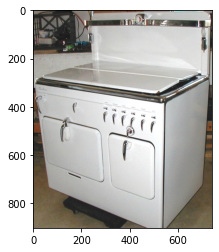

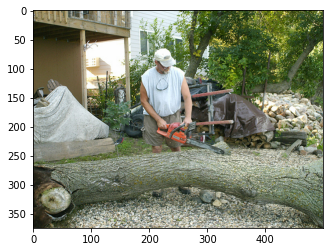

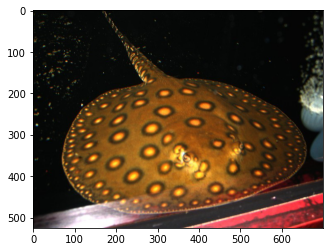

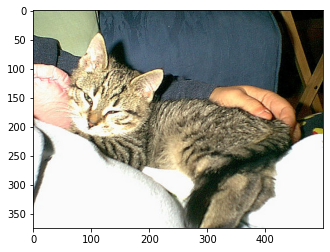

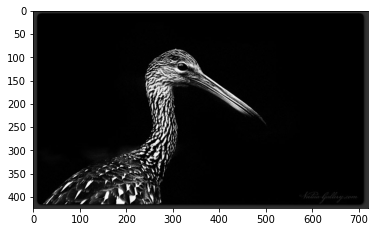

In [ ]:
#plot some sampless
path = "/content/drive/MyDrive/data"

random.seed(563)
for i in range(5):

    #create dataset
    tfm = transforms.Compose(
      [transforms.ToTensor()
      ]
    )
    rgb_dataset = torchvision.datasets.ImageFolder(path, transform=tfm)

    #select image
    
    x = random.randint(0,20246)
    rgb_image,_ = rgb_dataset[x]
    plt.imshow(rgb_image.permute(1,2,0))
    plt.savefig(f"{i}.png")
    plt.show()


### 0) Plot Resolutions

In [ ]:
#check resolution
path = "/content/drive/MyDrive/data"
resolutions = [50,100,200,300,400]

#fig params
rows = 5
columns = len(resolutions)
heights = np.repeat(5,rows)
widths = np.repeat(5,columns)
fig_width = 8.
fig_height = fig_width * sum(heights) / sum(widths)
fig,ax = plt.subplots(rows,columns,figsize=(fig_width, fig_height),gridspec_kw={'height_ratios':heights})

for i,res in enumerate(resolutions):

    #create dataset
    tfm = transforms.Compose(
      [T.Resize((res, res)),
        transforms.ToTensor()
      ]
    )
    rgb_dataset = torchvision.datasets.ImageFolder(path, transform=tfm)

    #select image
    random.seed(563)
    for j in range(5):
      x = random.randint(0,20246)
      rgb_image,_ = rgb_dataset[x]
      ax[j,i].imshow(rgb_image.permute(1,2,0))
      ax[0,i].set_title(f"{res}x{res}")
      ax[j,i].axis('off')

#plt.suptitle("Resolutions",fontsize=30,x=0.5,y=1.1)
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.savefig("Resolutions.png")
plt.show()

#1) Preprocessing


In [3]:
class TurnGray(object):
    """Convert images from RGB to grey scale"""
    
    def __call__(self, image):
        grey = T.Grayscale(1)(image)
        return grey
    
    
        

## 1.1) Datasets


In [36]:
path = "/content/drive/MyDrive/data"

rgb_transform = transforms.Compose(
    [T.Resize((200,200)),
     T.ToTensor()
    ]
)

bw_transform = T.Compose(
    [T.Resize((200,200)),
    TurnGray(),
    T.ToTensor()]
)

# read data from root
rgb_dataset = torchvision.datasets.ImageFolder(path, transform=rgb_transform)
bw_dataset = torchvision.datasets.ImageFolder(path, transform=bw_transform)

total_samples = len(rgb_dataset)
train_samples = int(0.6 * total_samples)
val_samples = int(0.1 * total_samples)
test_samples = int(0.3 * total_samples)

#define subsets for RGB and BW images
rgb_train = Subset(rgb_dataset, range(0,train_samples))
rgb_val = Subset(rgb_dataset,range(train_samples,train_samples+val_samples))
rgb_test = Subset(rgb_dataset,range(train_samples+val_samples,total_samples))

bw_train = Subset(bw_dataset, range(0,train_samples))
bw_val = Subset(bw_dataset,range(train_samples,train_samples+val_samples))
bw_test = Subset(bw_dataset,range(train_samples+val_samples,total_samples))

print(f"Total Samples:{total_samples}")
print(f"Training Samples:{len(rgb_train)}")
print(f"Validation Samples:{len(rgb_val)}")
print(f"Test Samples:{len(rgb_test)}")



Total Samples:20426
Training Samples:12255
Validation Samples:2042
Test Samples:6129


### Study Colorization Distribution

In [5]:
def image_colorfulness(image):
    # split the image into its respective RGB components
    B, G, R = image[2,:,:], image[1,:,:], image[0,:,:]

    # compute rg = R - G
    rg = np.absolute(R - G)

    # compute yb = 0.5 * (R + G) - B
    yb = np.absolute(0.5 * (R + G) - B)

    # compute the mean and standard deviation of both `rg` and `yb`
    rgStd, rgMean = torch.std_mean(rg)
    ybStd, ybMean = torch.std_mean(yb)
    
    # combine the mean and standard deviations
    stdRoot = np.sqrt((rgStd ** 2) + (ybStd ** 2))
    meanRoot = np.sqrt((rgMean ** 2) + (ybMean ** 2))

    # derive the "colorfulness" metric and return it
    return stdRoot + (0.3 * meanRoot)

In [13]:
def colorization_distribution(dataset,verbose=False):
  metrics = []

  #loop over images
  for i, img in enumerate(dataset):

    #store data, discard labels
    image, _ = img

    #compute colorization
    metric = image_colorfulness(image)
    metrics.append(metric)

    #print progress
    if verbose==True and i%50==0:
      print(f"Image {i} of {len(dataset)}. {i*100/len(dataset)}%")

  return metrics


In [14]:
#perform study only on Training set
training_metrics = colorization_distribution(rgb_train,verbose=True)

Image 0 of 12255. 0.0%
Image 50 of 12255. 0.4079967360261118%
Image 100 of 12255. 0.8159934720522236%
Image 150 of 12255. 1.2239902080783354%
Image 200 of 12255. 1.6319869441044472%
Image 250 of 12255. 2.039983680130559%
Image 300 of 12255. 2.4479804161566707%
Image 350 of 12255. 2.8559771521827826%
Image 400 of 12255. 3.2639738882088944%
Image 450 of 12255. 3.6719706242350063%
Image 500 of 12255. 4.079967360261118%
Image 550 of 12255. 4.48796409628723%
Image 600 of 12255. 4.8959608323133414%
Image 650 of 12255. 5.303957568339453%
Image 700 of 12255. 5.711954304365565%
Image 750 of 12255. 6.119951040391677%
Image 800 of 12255. 6.527947776417789%
Image 850 of 12255. 6.935944512443901%
Image 900 of 12255. 7.343941248470013%
Image 950 of 12255. 7.751937984496124%
Image 1000 of 12255. 8.159934720522235%
Image 1050 of 12255. 8.567931456548347%
Image 1100 of 12255. 8.97592819257446%
Image 1150 of 12255. 9.383924928600571%
Image 1200 of 12255. 9.791921664626683%
Image 1250 of 12255. 10.199918

For cut 0 = 0.08, we keep 9582 samples over 12255.
For cut 1 = 0.1, we keep 8138 samples over 12255.
For cut 2 = 0.12, we keep 6629 samples over 12255.


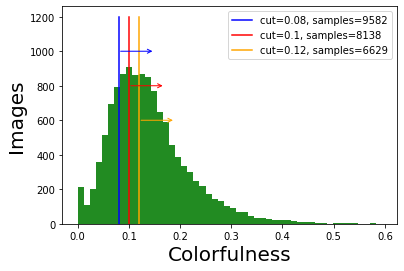

In [25]:
cuts = [0.08,0.1,0.12] 

lines = [np.repeat(cut,4) for cut in cuts]

#print data values
data = []

for i,cut in enumerate(cuts):
  mask = training_metrics>np.repeat(cut,len(training_metrics)) #boolean array
  res = np.sum(mask)
  data.append(res)

  #print results
  print(f"For cut {i} = {cut}, we keep {res} samples over {len(rgb_train)}.")

#plot distribution of color metric
plt.figure(1)
plt.hist(training_metrics,bins=50,color="forestgreen")
plt.plot(lines[0],np.arange(0,1600,400),color="blue",label=f"cut=0.08, samples={data[0]}")
plt.annotate("", xy=(0.15, 1000), xytext=(0.08, 1000),arrowprops=dict(arrowstyle="->",color="blue"))

plt.plot(lines[1],np.arange(0,1600,400),color="red",label=f"cut=0.1, samples={data[1]}")
plt.annotate("", xy=(0.17, 800), xytext=(0.1, 800),arrowprops=dict(arrowstyle="->",color="red"))

plt.plot(lines[2],np.arange(0,1600,400),color="orange",label=f"cut=0.12, samples={data[2]}")
plt.annotate("", xy=(0.19, 600), xytext=(0.12, 600),arrowprops=dict(arrowstyle="->",color="orange"))

#plt.title("Dist.",fontsize=30)
plt.xlabel("Colorfulness",fontsize=20)
plt.ylabel("Images",fontsize=20)
plt.legend()
#plt.savefig("Distribution.png")
plt.show()



In [38]:
#apply selected cut
selected_cut = 0.08

#compute mask
mask = training_metrics>np.repeat(selected_cut,len(training_metrics))
indices = [i for i, val in enumerate(mask) if val]


#summarize amount of data
print(f"Total amount of data: {len(rgb_dataset)}.")
print(f"Selected for Training: {len(rgb_train)}\n")

#redefine trainind dataset
rgb_cut_train = Subset(rgb_train, indices)
bw_cut_train = Subset(bw_train, indices)
print(f"After cut:\n Accepted: {np.sum(mask)}, Refused: {len(mask)-np.sum(mask)}")
print(f"Selected for Validation: {len(rgb_val)}\n")
print(f"Selected for Test: {len(rgb_test)}\n")

#check with bw datasets
train_check = len(rgb_train)==len(bw_train)
val_check = len(rgb_val)==len(bw_val)
test_check = len(rgb_test)==len(bw_test)
overall = train_check and val_check and test_check
print(f"Check with bw: {overall}")



Total amount of data: 20426.
Selected for Training: 12255

After cut:
 Accepted: 9582, Refused: 2673
Selected for Validation: 2042

Selected for Test: 6129

Check with bw: True


## 1.2) Dataloaders

In [ ]:
#define dataloaders
batch_size=128
train_rgb_loader = torch.utils.data.DataLoader(rgb_train,batch_size=batch_size,
                                               shuffle=False,num_workers=12)
val_rgb_loader = torch.utils.data.DataLoader(rgb_val,batch_size=batch_size,
                                             shuffle=False,num_workers=12)
test_rgb_loader = torch.utils.data.DataLoader(rgb_test,batch_size=batch_size,
                                              shuffle=False,num_workers=12)

train_bw_loader = torch.utils.data.DataLoader(bw_train,batch_size=batch_size,
                                              shuffle=False,num_workers=12)
val_bw_loader = torch.utils.data.DataLoader(bw_val,batch_size=batch_size,
                                            shuffle=False,num_workers=12)
test_bw_loader = torch.utils.data.DataLoader(bw_test,batch_size=batch_size,
                                             shuffle=False,num_workers=12)

print(f"Number of Training batches:{len(train_rgb_loader)}")
print(f"Number of Validation batches:{len(val_rgb_loader)}")
print(f"Number of Test batches:{len(test_rgb_loader)}")

## Check over batched data

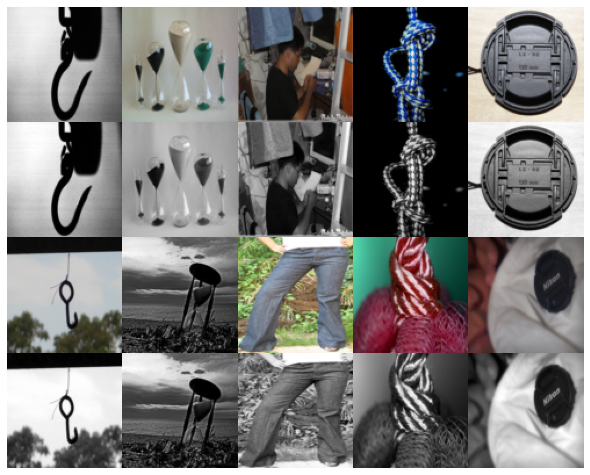

In [ ]:
#CHECK OVER BATCHED DATA

#fig params
rows = 4
columns = 5
heights = np.repeat(5,rows)
widths = np.repeat(5,columns)
fig_width = 8.
fig_height = fig_width * sum(heights) / sum(widths)
fig,ax = plt.subplots(rows,columns,figsize=(fig_width, fig_height),gridspec_kw={'height_ratios':heights})

bw_iterator = iter(val_bw_loader)
rgb_iterator = iter(val_rgb_loader)

for i in range(columns):
    bw_batch,_ = next(bw_iterator) 
    rgb_batch,_ = next(rgb_iterator)

    bw_image = bw_batch[0]
    rgb_image = rgb_batch[0]

    #select image
    ax[0,i].imshow(rgb_image.permute(1,2,0))
    ax[1,i].imshow(bw_image.permute(1,2,0).squeeze(-1),cmap=plt.get_cmap('gray'))
    ax[2,i].imshow(rgb_batch[1].permute(1,2,0))
    ax[3,i].imshow(bw_batch[1].permute(1,2,0).squeeze(-1),cmap=plt.get_cmap('gray'))
    ax[0,i].axis('off');ax[1,i].axis('off');ax[2,i].axis('off');ax[3,i].axis('off')
    
      
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.savefig("BW_vs_RGB.png")
plt.show()




# 2)Implement the UNET Autoencoder.

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.xavier_uniform_(m.weight.data)
    if classname.find('Linear') != -1:
        nn.init.xavier_uniform_(m.weight.data)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.2)
        nn.init.constant_(m.bias.data, 0)

## Simplified

In [ ]:
class SimplifiedUNET(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        ### CONTRACTING

        ###LEVEL 1
        self.conv1 = nn.Sequential(nn.Conv2d(in_channels=1, out_channels=64, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                  nn.LeakyReLU(0.2,True))
        self.conv2 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                  nn.LeakyReLU(0.2,True))
        self.conv3 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                  nn.LeakyReLU(0.2,True))
        self.downsampling = nn.MaxPool2d(kernel_size=2,stride=2)
        
        ###LEVEL 2
        self.conv4 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                  nn.LeakyReLU(0.2,True))
        self.conv5 = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                  nn.LeakyReLU(0.2,True))
        self.conv6 = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                  nn.LeakyReLU(0.2,True))
        
        ### EXPANSIVE
        self.upconv = nn.Sequential(nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=2, 
                           stride=2, padding=0, output_padding=0),nn.LeakyReLU(0.2,True))
      
        ###LEVEL 1
        self.conv7 = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, 
                           stride=1, padding=0),
                           nn.BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                           nn.LeakyReLU(0.2,True))
        self.conv8 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=32, kernel_size=3, 
                           stride=1, padding=0),
                           nn.BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                           nn.LeakyReLU(0.2,True))
        self.conv9 = nn.Sequential(nn.Conv2d(in_channels=32, out_channels=3, kernel_size=3, 
                           stride=1, padding=0),
                           nn.BatchNorm2d(3, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                           nn.LeakyReLU(0.2,True))
        
    def forward(self, x):

        #level1
        x = self.conv1(x)
        x = self.conv2(x)
        y = self.conv3(x)
        x = self.downsampling(y)
  
        #level2
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        x = self.upconv(x)

        #level1
        res = np.shape(x)[-1]
        y = T.functional.center_crop(y, (res,res))
        x = self.conv7(torch.cat((x,y),1))
        x = self.conv8(x)
        x = self.conv9(x)

        x = torch.sigmoid(x)

        return x

#print number of trainable parameters
model = SimplifiedUNET()
total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Trainable Parameters:",total_params)

Trainable Parameters: 570825


In [ ]:
torch.cuda.empty_cache()

### Check Propagation

In [ ]:
#Select device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print("device=",device)

unet = SimplifiedUNET().to(device) #move NN to device
unet.apply(weights_init)

#fig params
rows = 3
columns = 5
heights = np.repeat(5,rows)
widths = np.repeat(5,columns)
fig_width = 8.
fig_height = fig_width * sum(heights) / sum(widths)
fig,ax = plt.subplots(rows,columns,figsize=(fig_width, fig_height),gridspec_kw={'height_ratios':heights})

bw_iterator = iter(train_bw_loader)
rgb_iterator = iter(train_rgb_loader)

for i in range(5):

    with torch.no_grad():

        bw_batch,_ = next(bw_iterator) 
        bw_batch = bw_batch.to(device)
        rgb_batch,_ = next(rgb_iterator)
        rgb_batch = rgb_batch.to(device)
      
        bw_image = bw_batch[0].permute(1,2,0).cpu().detach().numpy()
        rgb_image = rgb_batch[0].permute(1,2,0).cpu().detach().numpy()
        processed_image = unet(bw_batch)
        processed_image = processed_image[0].permute(1,2,0).cpu().detach().numpy()
        
        #select image
        ax[0,i].imshow(rgb_image)
        ax[1,i].imshow(bw_image.squeeze(-1),cmap=plt.get_cmap('gray'))
        ax[2,i].imshow(processed_image,vmin=0,vmax=1)
        ax[0,i].axis('off');ax[1,i].axis('off');ax[2,i].axis('off')
        
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.savefig("SimplifiedUNET_propagation.png")
plt.show()

## Normal

In [ ]:
class UNET(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        ### CONTRACTING

        ###LEVEL 1
        self.conv1 = nn.Sequential(nn.Conv2d(in_channels=1, out_channels=64, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                  nn.LeakyReLU(0.2,True))
        self.conv2 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                  nn.LeakyReLU(0.2,True))
        self.downsampling = nn.MaxPool2d(kernel_size=2,stride=2)
        
        ###LEVEL 2
        self.conv3 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                  nn.LeakyReLU(0.2,True))
        self.conv4 = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                  nn.LeakyReLU(0.2,True))
    
        ###LEVEL 3
        self.conv5 = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                  nn.LeakyReLU(0.2,True))
        self.conv6 = nn.Sequential(nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                  nn.LeakyReLU(0.2,True))
        self.conv7 = nn.Sequential(nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                  nn.LeakyReLU(0.2,True))
        ### EXPANSIVE
        self.upconv2 = nn.Sequential(nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=2, 
                           stride=2, padding=0, output_padding=0),nn.LeakyReLU(0.2,True))
      
        ###LEVEL2
        self.conv8 = nn.Sequential(nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, 
                           stride=1, padding=0),
                           nn.BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                           nn.LeakyReLU(0.2,True))
        self.conv9 = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, 
                           stride=1, padding=0),
                           nn.BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                           nn.LeakyReLU(0.2,True))
        
        self.upconv1 = nn.Sequential(nn.ConvTranspose2d(in_channels=64, out_channels=64, kernel_size=2, 
                           stride=2, padding=0, output_padding=0),nn.LeakyReLU(0.2,True))
        ###LEVEL1
        self.conv10 = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, 
                           stride=1, padding=0),
                           nn.BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
                           nn.LeakyReLU(0.2,True))
        self.conv11 = nn.Conv2d(in_channels=64, out_channels=3, kernel_size=1, 
                               stride=1, padding=1)
        
    def forward(self, x):

        ###CONTRACTING
        #level1
        x = self.conv1(x)
        y1 = self.conv2(x)
        x = self.downsampling(y1)
  
        #level2
        x = self.conv3(x)
        y2 = self.conv4(x)
        x = self.downsampling(y2)
      
        #level3
        x = self.conv5(x)
        x = self.conv6(x)
        x = self.conv7(x)
        x = self.upconv2(x)

        #level2
        size_2 = np.shape(x)[-1]
        x2 = T.functional.center_crop(y2, (size_2,size_2))
        x = self.conv8(torch.cat((x,x2),1))
        x = self.conv9(x)
        x = self.upconv1(x)

        #level1
        size_1 = np.shape(x)[-1]
        x1 = T.functional.center_crop(y1, (size_1,size_1))
        x = self.conv10(torch.cat((x,x1),1))
        x = self.conv11(x)

        x = torch.sigmoid(x)

        return x

#print number of trainable parameters
model = UNET()
total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Trainable Parameters:",total_params)

Trainable Parameters: 2327619


In [ ]:
torch.cuda.empty_cache()

### Check propagation

In [ ]:
#Select device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
#print("device=",device)

unet = UNET().to(device) #move NN to device
unet.apply(weights_init)

#fig params
rows = 3
columns = 5
heights = np.repeat(5,rows)
widths = np.repeat(5,columns)
fig_width = 8.
fig_height = fig_width * sum(heights) / sum(widths)
fig,ax = plt.subplots(rows,columns,figsize=(fig_width, fig_height),gridspec_kw={'height_ratios':heights})

bw_iterator = iter(train_bw_loader)
rgb_iterator = iter(train_rgb_loader)

for i in range(5):

    with torch.no_grad():

        bw_batch,_ = next(bw_iterator) 
        bw_batch = bw_batch.to(device)
        rgb_batch,_ = next(rgb_iterator)
        rgb_batch = rgb_batch.to(device)

      
        bw_image = bw_batch[0].permute(1,2,0).cpu().detach().numpy()
        rgb_image = rgb_batch[0].permute(1,2,0).cpu().detach().numpy()
        processed_image = unet(bw_batch)
        processed_image = processed_image[0].permute(1,2,0).cpu().detach().numpy()
        #select image
        ax[0,i].imshow(rgb_image)
        ax[1,i].imshow(bw_image.squeeze(-1),cmap=plt.get_cmap('gray'))
        ax[2,i].imshow(processed_image,vmin=0,vmax=1)
        ax[0,i].axis('off');ax[1,i].axis('off');ax[2,i].axis('off')
        

#plt.suptitle("Resolutions",fontsize=30,x=0.5,y=1.1)
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.savefig("UNET_propagation.png")
plt.show()

In [ ]:
torch.cuda.empty_cache()

# 3) Implement the patch GAN.

In [ ]:
def linear_dim(dim,n_cl, channels, kernel_size,padding=0,stride=1):
        
    #for each convolutional layer update dimension
    for i in range(n_cl):
        dim = len(np.arange(0,dim-kernel_size+1,stride))
        
    #update dimensions of linear layers
    first_linear = int(channels*(dim)**2)
    second_linear = int(first_linear/2)

    return [first_linear,second_linear]

## Simplified

In [ ]:
class SimplifiedPatchGAN(nn.Module):
    
    def __init__(self,divisor):
        super().__init__()

        self.divisor = divisor
    
        #first conv
        self.conv1 = nn.Sequential(nn.Conv2d(in_channels=4, out_channels=32, kernel_size=3, 
                  stride=1, padding=0),
                  nn.LeakyReLU(0.2, inplace=True))
        
        self.conv2 = nn.Sequential(nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(64),
                  nn.LeakyReLU(0.2, inplace=True))
        
        self.conv3 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(128),
                  nn.LeakyReLU(0.2, inplace=True))
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1) 
        
        #keep track of dimension
        dimension,_ = linear_dim(dim=int(76/self.divisor),n_cl=3, channels=128, 
                               kernel_size=3,padding=0,stride=1)

        # linear layer
        self.linear = nn.Sequential(nn.Linear(in_features=dimension, out_features=1),
                      nn.LeakyReLU(0.2, inplace=True))
        
        
    def forward(self,x):
        
        #dimension of patches
        kernel_size = int(np.shape(x)[-1]/self.divisor)
         
        #subdivide image in patches
        unfold = nn.Unfold(kernel_size=kernel_size,stride=kernel_size)
        size = np.shape(x)[0] #batch_size
        patches = unfold(x)

        #reshape properly
        patches = patches.reshape((size,4,kernel_size,kernel_size,self.divisor**2))
        patches = patches.permute(4,0,1,2,3)
        
        y=0
        for p in patches:

            #reshape single patch
            x = p.reshape((size,4,kernel_size,kernel_size))
            print(np.shape(x))

            #propagate
            x = self.conv1(x)
            print(np.shape(x))
            x = self.conv2(x)
            print(np.shape(x))
            x = self.conv3(x)
            print(np.shape(x))
            x = self.flatten(x)
            print(np.shape(x))
            x = self.linear(x)
            print(np.shape(x))
            x = torch.sigmoid(x)
            y+=x
            
        #compute average
        y = y/len(patches)

        return y

model = SimplifiedPatchGAN(divisor=3)
total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Trainable Parameters:",total_params)

Trainable Parameters: 140129


In [ ]:
torch.cuda.empty_cache()

### Check Propagation

device= cuda
torch.Size([800, 4, 38, 38])
torch.Size([800, 32, 36, 36])
torch.Size([800, 64, 34, 34])
torch.Size([800, 128, 32, 32])
torch.Size([800, 131072])
torch.Size([800, 1])
torch.Size([800, 4, 38, 38])
torch.Size([800, 32, 36, 36])
torch.Size([800, 64, 34, 34])
torch.Size([800, 128, 32, 32])
torch.Size([800, 131072])
torch.Size([800, 1])
torch.Size([800, 4, 38, 38])
torch.Size([800, 32, 36, 36])
torch.Size([800, 64, 34, 34])
torch.Size([800, 128, 32, 32])
torch.Size([800, 131072])
torch.Size([800, 1])
torch.Size([800, 4, 38, 38])
torch.Size([800, 32, 36, 36])
torch.Size([800, 64, 34, 34])
torch.Size([800, 128, 32, 32])
torch.Size([800, 131072])
torch.Size([800, 1])
torch.Size([800, 4, 38, 38])
torch.Size([800, 32, 36, 36])
torch.Size([800, 64, 34, 34])
torch.Size([800, 128, 32, 32])
torch.Size([800, 131072])
torch.Size([800, 1])
torch.Size([800, 4, 38, 38])
torch.Size([800, 32, 36, 36])
torch.Size([800, 64, 34, 34])
torch.Size([800, 128, 32, 32])
torch.Size([800, 131072])
torch.

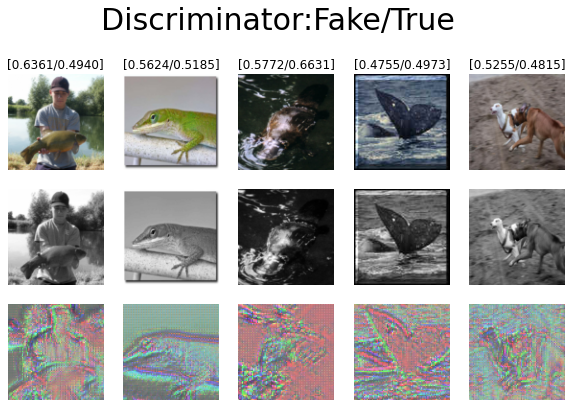

In [ ]:
#Select device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print("device=",device)

#check propagation through patchgan
unet = SimplifiedUNET().to(device) #move NN to device
unet.apply(weights_init)
patchgan = SimplifiedPatchGAN(divisor=2).to(device)
patchgan = patchgan.apply(weights_init)

bw_iterator = iter(train_bw_loader)
rgb_iterator = iter(train_rgb_loader)

#fig params
rows = 3
columns = 5
heights = np.repeat(5,rows)
widths = np.repeat(5,columns)
fig_width = 10.
fig_height = fig_width * sum(heights) / sum(widths)
fig,ax = plt.subplots(rows,columns,figsize=(fig_width, fig_height),gridspec_kw={'height_ratios':heights})


for i in range(columns):

    with torch.no_grad():

      bw_batch,_ = next(bw_iterator) 
      rgb_batch,_ = next(rgb_iterator)

      #they must stay in device
      bw_batch = bw_batch.to(device)
      rgb_batch = rgb_batch.to(device)

      #generator
      processed_image = unet(bw_batch)
      size = np.shape(processed_image[0].cpu().detach().numpy())[-1]

      #crop original images
      colored = T.functional.center_crop(rgb_batch,(size,size))
      original = T.functional.center_crop(bw_batch,(size,size))
      
      #concatenate 
      fake_pair = torch.cat((processed_image,original),1) #1 if in batch
      true_pair = torch.cat((colored,original),1)

      #compute patch output
      fake_output = patchgan(fake_pair).cpu().detach().numpy()
      true_output = patchgan(true_pair).cpu().detach().numpy()
      
      #select image
      rgb_image = rgb_batch[0].permute(1,2,0).cpu().detach().numpy()
      bw_image = bw_batch[0].permute(1,2,0).squeeze(-1).cpu().detach().numpy()
      processed_image = processed_image[0].permute(1,2,0).cpu().detach().numpy()
      
      ax[0,i].imshow(rgb_image)
      ax[0,i].set_title("[%.4f/%.4f]" %(fake_output[0][0],true_output[0][0]))
      ax[1,i].imshow(bw_image,cmap=plt.get_cmap('gray'))
      ax[2,i].imshow(processed_image)
      ax[0,i].axis('off');ax[1,i].axis('off');ax[2,i].axis('off')

plt.title("Discriminator:Fake/True",fontsize=30,x=-2,y=3.8)
plt.savefig("SimplifiedPatchGAN.png")
plt.show()

## Normal


In [ ]:
class PatchGAN(nn.Module):
    
    def __init__(self,divisor):
        super().__init__()
        
        self.divisor = divisor
        #first conv
        #4x81x81
        self.conv1 = nn.Sequential(nn.Conv2d(in_channels=4, out_channels=32, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(32),
                  nn.LeakyReLU(0.2, inplace=True))
        
        #second conv
        self.conv2 = nn.Sequential(nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(64),
                  nn.LeakyReLU(0.2, inplace=True))
        
        #third conv
        self.conv3 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(128),
                  nn.LeakyReLU(0.2, inplace=True))
        
        #third conv
        self.conv4 = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(256),
                  nn.LeakyReLU(0.2, inplace=True))
        
        #third conv
        self.conv5 = nn.Sequential(nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, 
                  stride=1, padding=0),
                  nn.BatchNorm2d(256),
                  nn.LeakyReLU(0.2, inplace=True))
        

        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1) 
        
        #keep track of dimension
        dimension,_ = linear_dim(dim=int(156/self.divisor),n_cl=5, channels=256, 
                               kernel_size=3,padding=0,stride=1)

        # linear layer
        self.linear = nn.Sequential(nn.Linear(in_features=dimension, out_features=1),
                      nn.LeakyReLU(0.2, inplace=True))
        
                       
        
        
    def forward(self,x):

        #dimension of patches
        kernel_size = int(np.shape(x)[-1]/self.divisor)
         
        #subdivide image in patches
        unfold = nn.Unfold(kernel_size=kernel_size,stride=kernel_size)
        size = np.shape(x)[0] #batch_size
        patches = unfold(x)

        #reshape properly
        patches = patches.reshape((size,4,kernel_size,kernel_size,self.divisor**2))
        patches = patches.permute(4,0,1,2,3)
        
        y=0
        for p in patches:

            x = p.reshape((size,4,kernel_size,kernel_size))
            print(np.shape(x))

            x = self.conv1(x)
            print(np.shape(x))
            x = self.conv2(x)
            print(np.shape(x))
            x = self.conv3(x)
            print(np.shape(x))
            x = self.conv4(x)
            print(np.shape(x))
            x = self.conv5(x)
            print(np.shape(x))
            x = self.flatten(x)
            print(np.shape(x))
            x = self.linear(x)
            print(np.shape(x))

            x = torch.sigmoid(x)
            y+=x
            
        #compute average
        y = y/len(patches)
  
        return y
         

model = PatchGAN(divisor=3)
total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Trainable Parameters:",total_params)

Trainable Parameters: 1431841


### Check Propagation

device= cuda
torch.Size([128, 4, 52, 52])
torch.Size([128, 32, 50, 50])
torch.Size([128, 64, 48, 48])
torch.Size([128, 128, 46, 46])
torch.Size([128, 256, 44, 44])
torch.Size([128, 256, 42, 42])
torch.Size([128, 451584])
torch.Size([128, 1])
torch.Size([128, 4, 52, 52])
torch.Size([128, 32, 50, 50])
torch.Size([128, 64, 48, 48])
torch.Size([128, 128, 46, 46])
torch.Size([128, 256, 44, 44])
torch.Size([128, 256, 42, 42])
torch.Size([128, 451584])
torch.Size([128, 1])
torch.Size([128, 4, 52, 52])
torch.Size([128, 32, 50, 50])
torch.Size([128, 64, 48, 48])
torch.Size([128, 128, 46, 46])
torch.Size([128, 256, 44, 44])
torch.Size([128, 256, 42, 42])
torch.Size([128, 451584])
torch.Size([128, 1])
torch.Size([128, 4, 52, 52])
torch.Size([128, 32, 50, 50])
torch.Size([128, 64, 48, 48])
torch.Size([128, 128, 46, 46])
torch.Size([128, 256, 44, 44])
torch.Size([128, 256, 42, 42])
torch.Size([128, 451584])
torch.Size([128, 1])
torch.Size([128, 4, 52, 52])
torch.Size([128, 32, 50, 50])
torch.Size([

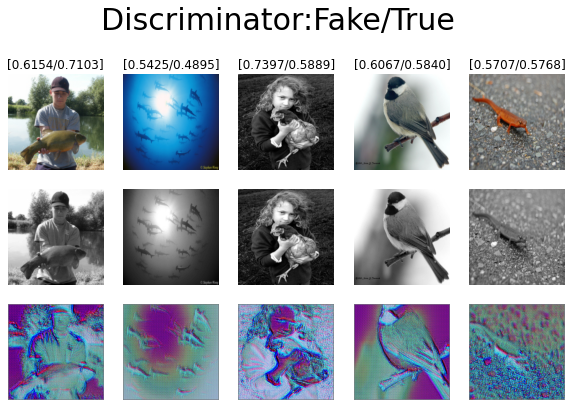

In [ ]:
#Select device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print("device=",device)

#check propagation through patchgan

unet = UNET().to(device)
unet = unet.apply(weights_init)
patchgan = PatchGAN(divisor=3).to(device)
patchgan = patchgan.apply(weights_init)


bw_iterator = iter(train_bw_loader)
rgb_iterator = iter(train_rgb_loader)

#fig params
rows = 3
columns = 5
heights = np.repeat(5,rows)
widths = np.repeat(5,columns)
fig_width = 10.
fig_height = fig_width * sum(heights) / sum(widths)
fig,ax = plt.subplots(rows,columns,figsize=(fig_width, fig_height),gridspec_kw={'height_ratios':heights})


for i in range(columns):

    with torch.no_grad():

      bw_batch,_ = next(bw_iterator) 
      rgb_batch,_ = next(rgb_iterator)

      #they must stay in device
      bw_batch = bw_batch.to(device)
      rgb_batch = rgb_batch.to(device)

      #generator
      processed_image = unet(bw_batch)

      size = np.shape(processed_image)[-1]
      colored = T.functional.center_crop(rgb_batch,(size,size))
      original = T.functional.center_crop(bw_batch,(size,size))
      fake_pair = torch.cat((processed_image,original),1) #1 if in batch
      true_pair = torch.cat((colored,original),1)

      fake_output = patchgan(fake_pair).cpu().detach().numpy()
      true_output = patchgan(true_pair).cpu().detach().numpy()

      #select image
      rgb_image = rgb_batch[0].permute(1,2,0).cpu().detach().numpy()
      bw_image = bw_batch[0].permute(1,2,0).squeeze(-1).cpu().detach().numpy()
      processed_image = processed_image[0].permute(1,2,0).cpu().detach().numpy()
      
      ax[0,i].imshow(rgb_image)
      ax[0,i].set_title("[%.4f/%.4f]" %(fake_output[0][0],true_output[0][0]))
      ax[1,i].imshow(bw_image,cmap=plt.get_cmap('gray'))
      ax[2,i].imshow(processed_image)
      ax[0,i].axis('off');ax[1,i].axis('off');ax[2,i].axis('off')

plt.title("Discriminator:Fake/True",fontsize=30,x=-2,y=3.8)
plt.savefig("PatchGAN.png")
plt.show()

In [ ]:
class PatchGAN(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        #first conv
        self.conv1 = nn.Sequential(nn.Conv2d(in_channels=4, out_channels=64, kernel_size=3, 
                  stride=1, padding=0),nn.ReLU(True))
        
        #second conv
        self.conv2 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, 
                  stride=1, padding=0),nn.ReLU(True))
        
        #third conv
        self.conv3 = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, 
                  stride=1, padding=0),nn.ReLU(True))
        
        #fourth conv
        self.conv4 = nn.Sequential(nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, 
                  stride=1, padding=0),nn.ReLU(True))
        
        #fifth conv
        self.conv5 = nn.Sequential(nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, 
                  stride=1, padding=0),nn.ReLU(True))
        
        #sixth conv
        self.conv6 = nn.Sequential(nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, 
                  stride=1, padding=0),nn.ReLU(True))
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1) 
        
        ### Linear section
        # First linear layer
        self.linear = nn.Linear(in_features=7372800, out_features=2)
        
        
    def forward(self,x):
        
        #define patches
        unfold = nn.Unfold(kernel_size=130,stride=130)
        size = np.shape(x)[0]
        patches = unfold(x)
        patches = patches.permute(2,1,0)
        
        y=0
        for p in patches:

            x = p.reshape((size,4,130,130))

            x = self.conv1(x)
            x = self.conv2(x)
            x = self.conv3(x)
            x = self.conv4(x)
            x = self.conv5(x)
            x = self.flatten(x)
            x = self.linear(x)
            x = torch.sigmoid(x)
            y+=x
            
        #compute average
        y = y/len(patches)
        return y
         
        
        

In [ ]:
#check propagation through patchgan
patchgan = PatchGAN().to(device)

bw_iterator = iter(val_bw_loader)
rgb_iterator = iter(val_rgb_loader)

for i in range(len(bw_iterator)):

    with torch.no_grad():

      bw_batch,_ = next(bw_iterator) #discard labels
      rgb_batch,_ = next(rgb_iterator)

      #they must stay in device
      bw_image = bw_batch.to(device)
      rgb_image = rgb_batch.to(device)

      #generator
      processed_image = unet(bw_image)
      #discriminator

      colored = T.functional.center_crop(rgb_image,(390,390))
      original = T.functional.center_crop(bw_image,(390,390))
      fake_pair = torch.cat((processed_image,original),1) #1 if in batch
      true_pair = torch.cat((colored,original),1)


      fake_output = patchgan(fake_pair).cpu().detach().numpy()
      true_output = patchgan(true_pair).cpu().detach().numpy()
      print("Fake:",fake_output)
      print("True:",true_output)

      print("Original bw image")
      plt.imshow(bw_image[0].squeeze(0).cpu().detach().numpy(),cmap=plt.get_cmap('gray'))
      plt.show()

      print("colored image")
      processed_image = processed_image[0].permute(2,1,0).cpu().detach().numpy()
      plt.imshow(processed_image)
      plt.show()

    

      if i==5:
        break

In [ ]:
torch.cuda.empty_cache()

# 4) Training

## Simplified

In [ ]:
L1 = nn.L1Loss()

def generator_regularization(colored_image,reconstructed_image,device):
  regularization = L1(reconstructed_image,colored_image)
  return Variable(regularization,requires_grad=True)

In [ ]:
torch.cuda.empty_cache()

In [ ]:
#Select device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

# Training Loop
real_label= 1.
fake_label= 0.

#Loss criterion
criterion = nn.BCEWithLogitsLoss()

# Lists to keep track of progress
Simple_img_list = []
Simple_G_losses = []
Simple_D_losses = []
iters = 0

num_epochs = 100

#define models and move to
G = SimplifiedUNET().to(device)
G = G.apply(weights_init)
D = SimplifiedPatchGAN(divisor=2).to(device)
D = D.apply(weights_init)

# Setup ptimizers for both G and D
optimizerD = optim.Adam(D.parameters(),lr=0.0001,betas=(0.5,0.999))
optimizerG = optim.Adam(G.parameters(),lr=0.0001,betas=(0.5,0.999))

print("Starting Training Loop...")

#Loop over epochs
for epoch in range(num_epochs):

    #define iterators and their length
    iterator_rgb = iter(train_rgb_loader)
    rgb_len = len(iterator_rgb)
    iterator_bw = iter(train_bw_loader)
    bw_len = len(iterator_bw) 

    #Loop over batches
    G_batch_loss = []
    D_batch_loss = []
    for i in range(rgb_len-1):

        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        
        ## Train with all-real batch
        D.zero_grad()

        # Select batch and move to device
        batch_rgb,_ = next(iterator_rgb)
        batch_bw,_ = next(iterator_bw)
        batch_bw = batch_bw.to(device)
        batch_rgb = batch_rgb.to(device)

        # Generate fake image batch with G
        generated = G(batch_bw)
        image_size = generated.size()[-1]

        #center crop original batches
        batch_rgb = T.functional.center_crop(batch_rgb,(image_size,image_size))
        batch_bw = T.functional.center_crop(batch_bw,(image_size,image_size))


        #define tensor of real_label values
        b_size = batch_rgb.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

        # Forward pass real batch through D
        real_pair = torch.cat((batch_rgb,batch_bw),1) #x and y
        output = D(real_pair).view(-1)

        # Calculate loss on all-real batch
        errD_real = criterion(output, label)

        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        
        #store image every 100 epochs   
        if i==0 and epoch%5==0:
          plt.imshow(generated[0].permute(1,2,0).cpu().detach().numpy())
          plt.show()
          Simple_img_list.append(generated[0].permute(1,2,0).cpu().detach().numpy())

        #generate fake_label tensor
        label.fill_(fake_label)

        # Classify all fake batch with D
        fake_pair = torch.cat((generated,batch_bw),1)
        output = D(fake_pair.detach()).view(-1)

        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)

        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        
        # Update D
        optimizerD.step()

        # (2) Update G network: maximize log(D(G(z)))

        G.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost

        #perform another forward pass of all-fake batch through D
        output = D(fake_pair).view(-1)

        # Calculate G's loss based on this output
        errG = criterion(output, label)
        errG.backward()

        L1_term = 0.3 * generator_regularization(generated,batch_rgb,device)
        L1_term.backward()

        errg = errG + L1_term

        D_G_z2 = output.mean().item()

        # Update G
        optimizerG.step()

        # Output training stats
        print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
              % (epoch, num_epochs, i, len(iterator_rgb)-2,
                  errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_batch_loss.append(errG.item())
        D_batch_loss.append(errD.item())


    # Save network parameters at the end of epochs
    torch.save(G.state_dict(), 'G_SimpleAdam_params.pth')
    torch.save(D.state_dict(), 'D_SimpleAdam_params.pth')
      
    Simple_G_losses.append(np.mean(G_batch_loss))
    Simple_D_losses.append(np.mean(D_batch_loss))

### Plot Learning curves 

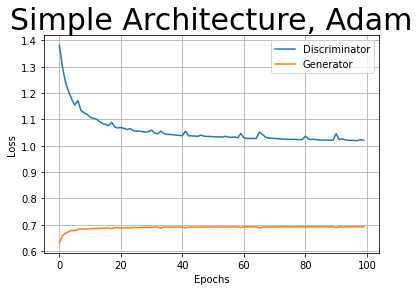

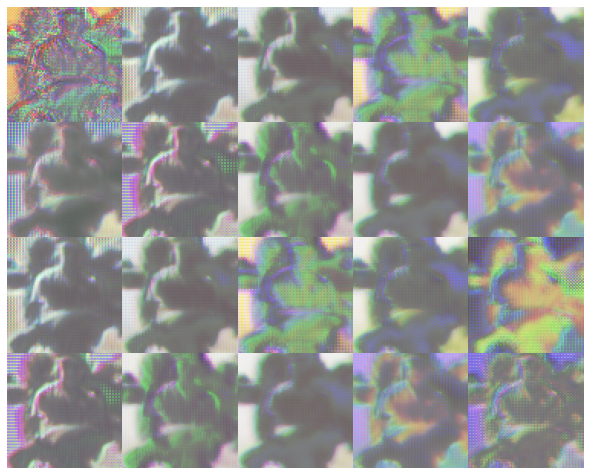

In [ ]:
#Learning curves per epoch
plt.figure()
plt.plot(Simple_D_losses,label="Discriminator")
plt.plot(Simple_G_losses,label="Generator")
plt.legend()
plt.title("Simple Architecture, Adam",fontsize=30)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.savefig("SimpleAdam_curves.png")
plt.grid()
plt.show()



#SGD_img_list #len=20
#plot images
#fig params
rows = 4
columns = 5
heights = np.repeat(5,rows)
widths = np.repeat(5,columns)
fig_width = 8.
fig_height = fig_width * sum(heights) / sum(widths)
fig,ax = plt.subplots(rows,columns,figsize=(fig_width, fig_height),gridspec_kw={'height_ratios':heights})

for i in range(rows):
    for j in range(columns):
        ax[i,j].imshow(Simple_img_list[i+2*j]) #now empty
        ax[i,j].axis('off')
        
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.savefig("SimpleAdam_image_generation.png")
plt.show()

## Normal

cuda
Starting Training Loop...


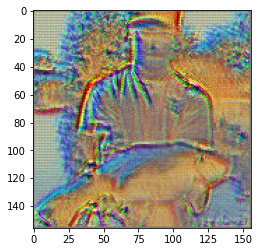

[0/30][0/94]	Loss_D: 1.4490	Loss_G: 0.6899	D(x): 0.5144	D(G(z)): 0.5083 / 0.0065
[0/30][1/94]	Loss_D: 1.3890	Loss_G: 0.6924	D(x): 0.0084	D(G(z)): 0.0136 / 0.0015
[0/30][2/94]	Loss_D: 1.3869	Loss_G: 0.6929	D(x): 0.0008	D(G(z)): 0.0020 / 0.0005
[0/30][3/94]	Loss_D: 1.3865	Loss_G: 0.6930	D(x): 0.0002	D(G(z)): 0.0006 / 0.0002
[0/30][4/94]	Loss_D: 1.3864	Loss_G: 0.6930	D(x): 0.0001	D(G(z)): 0.0004 / 0.0002
[0/30][5/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0001	D(G(z)): 0.0002 / 0.0001
[0/30][6/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0001	D(G(z)): 0.0002 / 0.0001
[0/30][7/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0001 / 0.0001
[0/30][8/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0002 / 0.0001
[0/30][9/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0001	D(G(z)): 0.0002 / 0.0001
[0/30][10/94]	Loss_D: 1.3864	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0002 / 0.0002
[0/30][11/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0001	D(G(z)): 0.0001 / 0.0001
[0/30][12/94]	Loss_D: 1.38

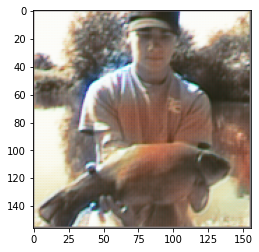

[5/30][0/94]	Loss_D: 1.1462	Loss_G: 0.6912	D(x): 0.6134	D(G(z)): 0.0001 / 0.0042
[5/30][1/94]	Loss_D: 1.1163	Loss_G: 0.6844	D(x): 0.7410	D(G(z)): 0.0265 / 0.0191
[5/30][2/94]	Loss_D: 1.1363	Loss_G: 0.6926	D(x): 0.6438	D(G(z)): 0.0015 / 0.0011
[5/30][3/94]	Loss_D: 1.1067	Loss_G: 0.6907	D(x): 0.7295	D(G(z)): 0.0112 / 0.0049
[5/30][4/94]	Loss_D: 1.1883	Loss_G: 0.6930	D(x): 0.6888	D(G(z)): 0.1370 / 0.0003
[5/30][5/94]	Loss_D: 1.2701	Loss_G: 0.6493	D(x): 0.2766	D(G(z)): 0.0002 / 0.0993
[5/30][6/94]	Loss_D: 1.1859	Loss_G: 0.6875	D(x): 0.5675	D(G(z)): 0.0472 / 0.0123
[5/30][7/94]	Loss_D: 1.1861	Loss_G: 0.6805	D(x): 0.6189	D(G(z)): 0.0750 / 0.0288
[5/30][8/94]	Loss_D: 1.1291	Loss_G: 0.6931	D(x): 0.7499	D(G(z)): 0.0576 / 0.0000
[5/30][9/94]	Loss_D: 1.1173	Loss_G: 0.6891	D(x): 0.7034	D(G(z)): 0.0064 / 0.0090
[5/30][10/94]	Loss_D: 1.1346	Loss_G: 0.6902	D(x): 0.6763	D(G(z)): 0.0246 / 0.0060
[5/30][11/94]	Loss_D: 1.1131	Loss_G: 0.6892	D(x): 0.7055	D(G(z)): 0.0025 / 0.0081
[5/30][12/94]	Loss_D: 1.17

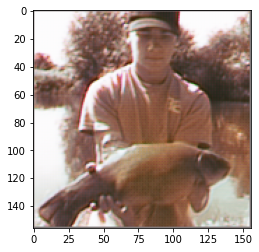

[10/30][0/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[10/30][1/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[10/30][2/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[10/30][3/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[10/30][4/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[10/30][5/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[10/30][6/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[10/30][7/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[10/30][8/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[10/30][9/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[10/30][10/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[10/30][11/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[10/30][12/94]

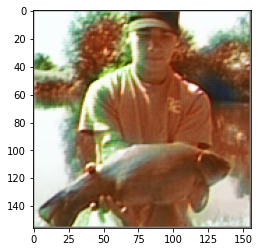

[15/30][0/94]	Loss_D: 1.3046	Loss_G: 0.6860	D(x): 0.2147	D(G(z)): 0.0162 / 0.0150
[15/30][1/94]	Loss_D: 1.2758	Loss_G: 0.6688	D(x): 0.3311	D(G(z)): 0.0481 / 0.0544
[15/30][2/94]	Loss_D: 1.3147	Loss_G: 0.6906	D(x): 0.2181	D(G(z)): 0.0379 / 0.0053
[15/30][3/94]	Loss_D: 1.2755	Loss_G: 0.6892	D(x): 0.2788	D(G(z)): 0.0123 / 0.0084
[15/30][4/94]	Loss_D: 1.3094	Loss_G: 0.6706	D(x): 0.2950	D(G(z)): 0.0836 / 0.0504
[15/30][5/94]	Loss_D: 1.3580	Loss_G: 0.6397	D(x): 0.3310	D(G(z)): 0.1928 / 0.1209
[15/30][6/94]	Loss_D: 1.2724	Loss_G: 0.6751	D(x): 0.3885	D(G(z)): 0.0826 / 0.0403
[15/30][7/94]	Loss_D: 1.2879	Loss_G: 0.6708	D(x): 0.4055	D(G(z)): 0.1127 / 0.0501
[15/30][8/94]	Loss_D: 1.2421	Loss_G: 0.6583	D(x): 0.5074	D(G(z)): 0.1066 / 0.0761
[15/30][9/94]	Loss_D: 1.2701	Loss_G: 0.6364	D(x): 0.5862	D(G(z)): 0.1972 / 0.1316
[15/30][10/94]	Loss_D: 1.2322	Loss_G: 0.6894	D(x): 0.6847	D(G(z)): 0.1940 / 0.0081
[15/30][11/94]	Loss_D: 1.1801	Loss_G: 0.6655	D(x): 0.6355	D(G(z)): 0.0773 / 0.0627
[15/30][12/94]

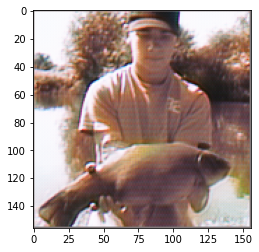

[20/30][0/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[20/30][1/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[20/30][2/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[20/30][3/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[20/30][4/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[20/30][5/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[20/30][6/94]	Loss_D: 1.3854	Loss_G: 0.6931	D(x): 0.0020	D(G(z)): 0.0000 / 0.0000
[20/30][7/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[20/30][8/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[20/30][9/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[20/30][10/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[20/30][11/94]	Loss_D: 1.3863	Loss_G: 0.6931	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[20/30][12/94]

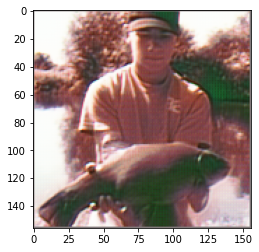

[25/30][0/94]	Loss_D: 1.0528	Loss_G: 0.6931	D(x): 0.8645	D(G(z)): 0.0000 / 0.0000
[25/30][1/94]	Loss_D: 1.0317	Loss_G: 0.6931	D(x): 0.9286	D(G(z)): 0.0000 / 0.0001
[25/30][2/94]	Loss_D: 1.0400	Loss_G: 0.6931	D(x): 0.9048	D(G(z)): 0.0000 / 0.0000
[25/30][3/94]	Loss_D: 1.0334	Loss_G: 0.6931	D(x): 0.9239	D(G(z)): 0.0000 / 0.0000
[25/30][4/94]	Loss_D: 1.0439	Loss_G: 0.6928	D(x): 0.8925	D(G(z)): 0.0015 / 0.0007
[25/30][5/94]	Loss_D: 1.0368	Loss_G: 0.6931	D(x): 0.9114	D(G(z)): 0.0000 / 0.0000
[25/30][6/94]	Loss_D: 1.0325	Loss_G: 0.6900	D(x): 0.9222	D(G(z)): 0.0005 / 0.0065
[25/30][7/94]	Loss_D: 1.0333	Loss_G: 0.6916	D(x): 0.9397	D(G(z)): 0.0133 / 0.0032
[25/30][8/94]	Loss_D: 1.0245	Loss_G: 0.6921	D(x): 0.9493	D(G(z)): 0.0020 / 0.0022
[25/30][9/94]	Loss_D: 1.0285	Loss_G: 0.6881	D(x): 0.9463	D(G(z)): 0.0079 / 0.0106
[25/30][10/94]	Loss_D: 1.0233	Loss_G: 0.6931	D(x): 0.9782	D(G(z)): 0.0170 / 0.0001
[25/30][11/94]	Loss_D: 1.0213	Loss_G: 0.6931	D(x): 0.9586	D(G(z)): 0.0022 / 0.0001
[25/30][12/94]

In [ ]:
#Select device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

# Training Loop
real_label= 1.
fake_label= 0.

#Loss criterion
criterion = nn.BCEWithLogitsLoss()

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []


num_epochs = 30

#define models and move to
G = UNET().to(device)
G = G.apply(weights_init)
D = PatchGAN(divisor=2).to(device)
D = D.apply(weights_init)

# Setup ptimizers for both G and D
optimizerD = optim.Adam(D.parameters(),lr=0.0001,betas=(0.5,0.999))
optimizerG = optim.Adam(G.parameters(),lr=0.0001,betas=(0.5,0.999))

print("Starting Training Loop...")

#Loop over epochs
for epoch in range(num_epochs):

    #define iterators and their length
    iterator_rgb = iter(train_rgb_loader)
    rgb_len = len(iterator_rgb)
    iterator_bw = iter(train_bw_loader)
    bw_len = len(iterator_bw) 

    #Loop over batches
    G_batch_loss = []
    D_batch_loss = []
    for i in range(rgb_len-1):

        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        
        ## Train with all-real batch
        D.zero_grad()

        # Select batch and move to device
        batch_rgb,_ = next(iterator_rgb)
        batch_bw,_ = next(iterator_bw)
        batch_bw = batch_bw.to(device)
        batch_rgb = batch_rgb.to(device)

        # Generate fake image batch with G
        generated = G(batch_bw)
        image_size = generated.size()[-1]

        #center crop original batches
        batch_rgb = T.functional.center_crop(batch_rgb,(image_size,image_size))
        batch_bw = T.functional.center_crop(batch_bw,(image_size,image_size))


        #define tensor of real_label values
        b_size = batch_rgb.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

        # Forward pass real batch through D
        real_pair = torch.cat((batch_rgb,batch_bw),1) #x and y
        output = D(real_pair).view(-1)

        # Calculate loss on all-real batch
        errD_real = criterion(output, label)

        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        
        #store image every 100 epochs   
        if i==0 and epoch%5==0:
          plt.imshow(generated[0].permute(1,2,0).cpu().detach().numpy())
          plt.show()
          img_list.append(generated[0].permute(1,2,0).cpu().detach().numpy())

        #generate fake_label tensor
        label.fill_(fake_label)

        # Classify all fake batch with D
        fake_pair = torch.cat((generated,batch_bw),1)
        output = D(fake_pair.detach()).view(-1)

        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)

        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        
        # Update D
        optimizerD.step()

        # (2) Update G network: maximize log(D(G(z)))

        G.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost

        #perform another forward pass of all-fake batch through D
        output = D(fake_pair).view(-1)

        # Calculate G's loss based on this output
        errG = criterion(output, label)
        errG.backward()

        L1_term = 0.3*generator_regularization(generated,batch_rgb,device)
        L1_term.backward()

        errg = errG + L1_term

        D_G_z2 = output.mean().item()

        # Update G
        optimizerG.step()

        # Output training stats
        print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
              % (epoch, num_epochs, i, len(iterator_rgb)-2,
                  errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_batch_loss.append(errG.item())
        D_batch_loss.append(errD.item())


    # Save network parameters at the end of epochs
    torch.save(G.state_dict(), 'G_Adam_params.pth')
    torch.save(D.state_dict(), 'D_Adam_params.pth')
      
    G_losses.append(np.mean(G_batch_loss))
    D_losses.append(np.mean(D_batch_loss))

### Plot Learning curves

6


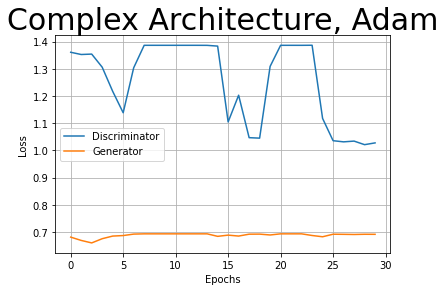

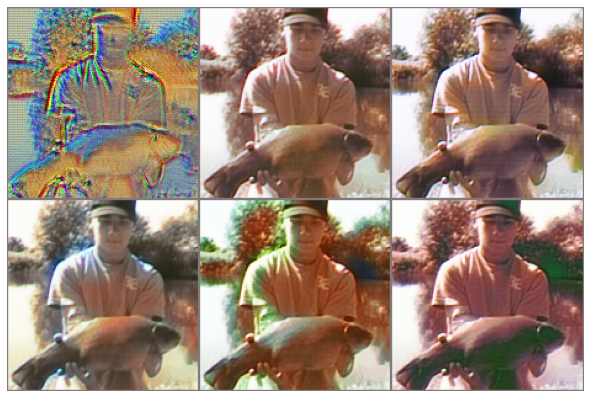

In [ ]:
print(len(img_list))
#Learning curves per epoch
plt.figure()
plt.plot(D_losses,label="Discriminator")
plt.plot(G_losses,label="Generator")
plt.legend()
plt.title("Complex Architecture, Adam",fontsize=30)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.savefig("Adam_curves.png")
plt.grid()
plt.show()



#SGD_img_list #len=20
#plot images
#fig params
rows = 2
columns = 3
heights = np.repeat(5,rows)
widths = np.repeat(5,columns)
fig_width = 8.
fig_height = fig_width * sum(heights) / sum(widths)
fig,ax = plt.subplots(rows,columns,figsize=(fig_width, fig_height),gridspec_kw={'height_ratios':heights})

for i in range(rows):
    for j in range(columns):
        ax[i,j].imshow(img_list[i+2*j]) #now empty
        ax[i,j].axis('off')
        
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.savefig("Adam_image_generation.png")
plt.show()

# 5) Compare optimizers


With fastes architecture

## SimpleSGD


cuda
Starting Training Loop...


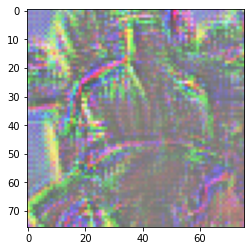

[0/100][0/14]	Loss_D: 1.4863	Loss_G: 0.4260	D(x): 0.6748	D(G(z)): 0.6548 / 0.6344
[0/100][1/14]	Loss_D: 1.4785	Loss_G: 0.4396	D(x): 0.6528	D(G(z)): 0.6317 / 0.5956
[0/100][2/14]	Loss_D: 1.4638	Loss_G: 0.4569	D(x): 0.6158	D(G(z)): 0.5896 / 0.5471
[0/100][3/14]	Loss_D: 1.4563	Loss_G: 0.4697	D(x): 0.5718	D(G(z)): 0.5537 / 0.5123
[0/100][4/14]	Loss_D: 1.4467	Loss_G: 0.4824	D(x): 0.5295	D(G(z)): 0.5143 / 0.4787
[0/100][5/14]	Loss_D: 1.4387	Loss_G: 0.4935	D(x): 0.4907	D(G(z)): 0.4784 / 0.4497
[0/100][6/14]	Loss_D: 1.4319	Loss_G: 0.5030	D(x): 0.4609	D(G(z)): 0.4489 / 0.4254
[0/100][7/14]	Loss_D: 1.4278	Loss_G: 0.5097	D(x): 0.4392	D(G(z)): 0.4284 / 0.4084
[0/100][8/14]	Loss_D: 1.4231	Loss_G: 0.5171	D(x): 0.4199	D(G(z)): 0.4081 / 0.3899
[0/100][9/14]	Loss_D: 1.4185	Loss_G: 0.5243	D(x): 0.4031	D(G(z)): 0.3892 / 0.3722
[0/100][10/14]	Loss_D: 1.4159	Loss_G: 0.5305	D(x): 0.3854	D(G(z)): 0.3728 / 0.3573
[0/100][11/14]	Loss_D: 1.4134	Loss_G: 0.5361	D(x): 0.3704	D(G(z)): 0.3583 / 0.3436
[0/100][12/14]

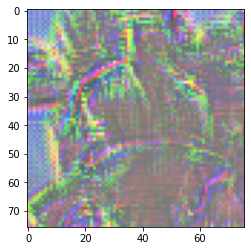

[5/100][0/14]	Loss_D: 1.3916	Loss_G: 0.6260	D(x): 0.1408	D(G(z)): 0.1406 / 0.1393
[5/100][1/14]	Loss_D: 1.3900	Loss_G: 0.6265	D(x): 0.1431	D(G(z)): 0.1395 / 0.1382
[5/100][2/14]	Loss_D: 1.3885	Loss_G: 0.6275	D(x): 0.1441	D(G(z)): 0.1374 / 0.1362
[5/100][3/14]	Loss_D: 1.3918	Loss_G: 0.6275	D(x): 0.1363	D(G(z)): 0.1374 / 0.1361
[5/100][4/14]	Loss_D: 1.3909	Loss_G: 0.6289	D(x): 0.1348	D(G(z)): 0.1343 / 0.1331
[5/100][5/14]	Loss_D: 1.3923	Loss_G: 0.6286	D(x): 0.1326	D(G(z)): 0.1350 / 0.1337
[5/100][6/14]	Loss_D: 1.3906	Loss_G: 0.6297	D(x): 0.1335	D(G(z)): 0.1325 / 0.1313
[5/100][7/14]	Loss_D: 1.3918	Loss_G: 0.6281	D(x): 0.1352	D(G(z)): 0.1361 / 0.1349
[5/100][8/14]	Loss_D: 1.3898	Loss_G: 0.6297	D(x): 0.1354	D(G(z)): 0.1325 / 0.1313
[5/100][9/14]	Loss_D: 1.3907	Loss_G: 0.6299	D(x): 0.1329	D(G(z)): 0.1320 / 0.1308
[5/100][10/14]	Loss_D: 1.3900	Loss_G: 0.6305	D(x): 0.1331	D(G(z)): 0.1309 / 0.1297
[5/100][11/14]	Loss_D: 1.3899	Loss_G: 0.6305	D(x): 0.1332	D(G(z)): 0.1307 / 0.1296
[5/100][12/14]

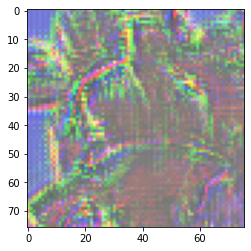

[10/100][0/14]	Loss_D: 1.3508	Loss_G: 0.6395	D(x): 0.2055	D(G(z)): 0.1110 / 0.1110
[10/100][1/14]	Loss_D: 1.3479	Loss_G: 0.6383	D(x): 0.2199	D(G(z)): 0.1140 / 0.1139
[10/100][2/14]	Loss_D: 1.3440	Loss_G: 0.6388	D(x): 0.2293	D(G(z)): 0.1131 / 0.1130
[10/100][3/14]	Loss_D: 1.3497	Loss_G: 0.6387	D(x): 0.2094	D(G(z)): 0.1130 / 0.1128
[10/100][4/14]	Loss_D: 1.3498	Loss_G: 0.6403	D(x): 0.2062	D(G(z)): 0.1096 / 0.1094
[10/100][5/14]	Loss_D: 1.3502	Loss_G: 0.6401	D(x): 0.2056	D(G(z)): 0.1102 / 0.1100
[10/100][6/14]	Loss_D: 1.3482	Loss_G: 0.6400	D(x): 0.2117	D(G(z)): 0.1103 / 0.1101
[10/100][7/14]	Loss_D: 1.3479	Loss_G: 0.6366	D(x): 0.2284	D(G(z)): 0.1187 / 0.1183
[10/100][8/14]	Loss_D: 1.3448	Loss_G: 0.6393	D(x): 0.2220	D(G(z)): 0.1123 / 0.1118
[10/100][9/14]	Loss_D: 1.3474	Loss_G: 0.6399	D(x): 0.2161	D(G(z)): 0.1110 / 0.1105
[10/100][10/14]	Loss_D: 1.3395	Loss_G: 0.6381	D(x): 0.2462	D(G(z)): 0.1156 / 0.1148
[10/100][11/14]	Loss_D: 1.3396	Loss_G: 0.6378	D(x): 0.2460	D(G(z)): 0.1167 / 0.1157
[1

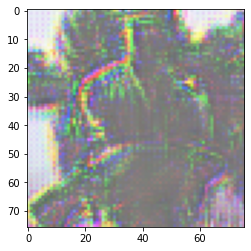

[15/100][0/14]	Loss_D: 1.3225	Loss_G: 0.6539	D(x): 0.2392	D(G(z)): 0.0812 / 0.0809
[15/100][1/14]	Loss_D: 1.3186	Loss_G: 0.6530	D(x): 0.2567	D(G(z)): 0.0839 / 0.0833
[15/100][2/14]	Loss_D: 1.3180	Loss_G: 0.6526	D(x): 0.2610	D(G(z)): 0.0850 / 0.0842
[15/100][3/14]	Loss_D: 1.3192	Loss_G: 0.6550	D(x): 0.2416	D(G(z)): 0.0789 / 0.0785
[15/100][4/14]	Loss_D: 1.3209	Loss_G: 0.6567	D(x): 0.2341	D(G(z)): 0.0750 / 0.0747
[15/100][5/14]	Loss_D: 1.3216	Loss_G: 0.6567	D(x): 0.2321	D(G(z)): 0.0751 / 0.0748
[15/100][6/14]	Loss_D: 1.3201	Loss_G: 0.6563	D(x): 0.2377	D(G(z)): 0.0758 / 0.0756
[15/100][7/14]	Loss_D: 1.3206	Loss_G: 0.6527	D(x): 0.2532	D(G(z)): 0.0846 / 0.0838
[15/100][8/14]	Loss_D: 1.3191	Loss_G: 0.6544	D(x): 0.2456	D(G(z)): 0.0804 / 0.0799
[15/100][9/14]	Loss_D: 1.3216	Loss_G: 0.6561	D(x): 0.2362	D(G(z)): 0.0764 / 0.0761
[15/100][10/14]	Loss_D: 1.3103	Loss_G: 0.6561	D(x): 0.2687	D(G(z)): 0.0765 / 0.0762
[15/100][11/14]	Loss_D: 1.3101	Loss_G: 0.6556	D(x): 0.2689	D(G(z)): 0.0775 / 0.0773
[1

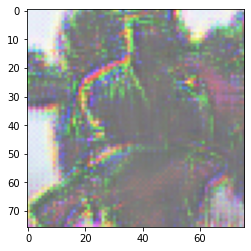

[20/100][0/14]	Loss_D: 1.2999	Loss_G: 0.6516	D(x): 0.3033	D(G(z)): 0.0868 / 0.0862
[20/100][1/14]	Loss_D: 1.2956	Loss_G: 0.6516	D(x): 0.3177	D(G(z)): 0.0868 / 0.0861
[20/100][2/14]	Loss_D: 1.2951	Loss_G: 0.6505	D(x): 0.3249	D(G(z)): 0.0898 / 0.0889
[20/100][3/14]	Loss_D: 1.2971	Loss_G: 0.6534	D(x): 0.3013	D(G(z)): 0.0826 / 0.0820
[20/100][4/14]	Loss_D: 1.2975	Loss_G: 0.6560	D(x): 0.2928	D(G(z)): 0.0766 / 0.0763
[20/100][5/14]	Loss_D: 1.2984	Loss_G: 0.6563	D(x): 0.2905	D(G(z)): 0.0760 / 0.0756
[20/100][6/14]	Loss_D: 1.2958	Loss_G: 0.6558	D(x): 0.2992	D(G(z)): 0.0772 / 0.0767
[20/100][7/14]	Loss_D: 1.2973	Loss_G: 0.6520	D(x): 0.3118	D(G(z)): 0.0856 / 0.0851
[20/100][8/14]	Loss_D: 1.2941	Loss_G: 0.6534	D(x): 0.3112	D(G(z)): 0.0825 / 0.0820
[20/100][9/14]	Loss_D: 1.2988	Loss_G: 0.6556	D(x): 0.2934	D(G(z)): 0.0775 / 0.0772
[20/100][10/14]	Loss_D: 1.2890	Loss_G: 0.6552	D(x): 0.3238	D(G(z)): 0.0784 / 0.0781
[20/100][11/14]	Loss_D: 1.2889	Loss_G: 0.6552	D(x): 0.3234	D(G(z)): 0.0785 / 0.0782
[2

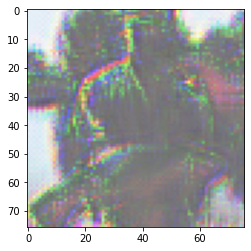

[25/100][0/14]	Loss_D: 1.2648	Loss_G: 0.6508	D(x): 0.3943	D(G(z)): 0.0873 / 0.0873
[25/100][1/14]	Loss_D: 1.2636	Loss_G: 0.6502	D(x): 0.4010	D(G(z)): 0.0888 / 0.0887
[25/100][2/14]	Loss_D: 1.2602	Loss_G: 0.6493	D(x): 0.4145	D(G(z)): 0.0909 / 0.0907
[25/100][3/14]	Loss_D: 1.2652	Loss_G: 0.6516	D(x): 0.3869	D(G(z)): 0.0858 / 0.0855
[25/100][4/14]	Loss_D: 1.2668	Loss_G: 0.6534	D(x): 0.3762	D(G(z)): 0.0817 / 0.0815
[25/100][5/14]	Loss_D: 1.2665	Loss_G: 0.6544	D(x): 0.3761	D(G(z)): 0.0795 / 0.0794
[25/100][6/14]	Loss_D: 1.2650	Loss_G: 0.6537	D(x): 0.3818	D(G(z)): 0.0810 / 0.0810
[25/100][7/14]	Loss_D: 1.2644	Loss_G: 0.6500	D(x): 0.3987	D(G(z)): 0.0890 / 0.0889
[25/100][8/14]	Loss_D: 1.2629	Loss_G: 0.6510	D(x): 0.3978	D(G(z)): 0.0869 / 0.0868
[25/100][9/14]	Loss_D: 1.2698	Loss_G: 0.6532	D(x): 0.3725	D(G(z)): 0.0821 / 0.0821
[25/100][10/14]	Loss_D: 1.2606	Loss_G: 0.6521	D(x): 0.4039	D(G(z)): 0.0846 / 0.0845
[25/100][11/14]	Loss_D: 1.2616	Loss_G: 0.6519	D(x): 0.4014	D(G(z)): 0.0852 / 0.0851
[2

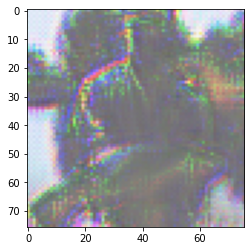

[30/100][0/14]	Loss_D: 1.2473	Loss_G: 0.6498	D(x): 0.4463	D(G(z)): 0.0905 / 0.0897
[30/100][1/14]	Loss_D: 1.2475	Loss_G: 0.6498	D(x): 0.4456	D(G(z)): 0.0904 / 0.0898
[30/100][2/14]	Loss_D: 1.2419	Loss_G: 0.6490	D(x): 0.4661	D(G(z)): 0.0924 / 0.0917
[30/100][3/14]	Loss_D: 1.2476	Loss_G: 0.6523	D(x): 0.4322	D(G(z)): 0.0848 / 0.0842
[30/100][4/14]	Loss_D: 1.2484	Loss_G: 0.6543	D(x): 0.4233	D(G(z)): 0.0802 / 0.0798
[30/100][5/14]	Loss_D: 1.2485	Loss_G: 0.6552	D(x): 0.4230	D(G(z)): 0.0784 / 0.0780
[30/100][6/14]	Loss_D: 1.2467	Loss_G: 0.6543	D(x): 0.4291	D(G(z)): 0.0802 / 0.0798
[30/100][7/14]	Loss_D: 1.2472	Loss_G: 0.6503	D(x): 0.4448	D(G(z)): 0.0889 / 0.0885
[30/100][8/14]	Loss_D: 1.2458	Loss_G: 0.6520	D(x): 0.4412	D(G(z)): 0.0852 / 0.0849
[30/100][9/14]	Loss_D: 1.2537	Loss_G: 0.6544	D(x): 0.4125	D(G(z)): 0.0800 / 0.0796
[30/100][10/14]	Loss_D: 1.2442	Loss_G: 0.6530	D(x): 0.4454	D(G(z)): 0.0831 / 0.0829
[30/100][11/14]	Loss_D: 1.2451	Loss_G: 0.6522	D(x): 0.4447	D(G(z)): 0.0848 / 0.0845
[3

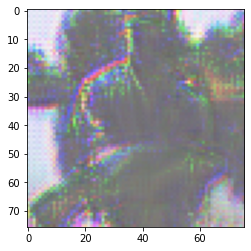

[35/100][0/14]	Loss_D: 1.2251	Loss_G: 0.6543	D(x): 0.4909	D(G(z)): 0.0800 / 0.0798
[35/100][1/14]	Loss_D: 1.2266	Loss_G: 0.6538	D(x): 0.4885	D(G(z)): 0.0812 / 0.0810
[35/100][2/14]	Loss_D: 1.2203	Loss_G: 0.6538	D(x): 0.5085	D(G(z)): 0.0814 / 0.0810
[35/100][3/14]	Loss_D: 1.2266	Loss_G: 0.6565	D(x): 0.4746	D(G(z)): 0.0753 / 0.0751
[35/100][4/14]	Loss_D: 1.2281	Loss_G: 0.6582	D(x): 0.4657	D(G(z)): 0.0718 / 0.0716
[35/100][5/14]	Loss_D: 1.2281	Loss_G: 0.6590	D(x): 0.4660	D(G(z)): 0.0701 / 0.0698
[35/100][6/14]	Loss_D: 1.2257	Loss_G: 0.6578	D(x): 0.4746	D(G(z)): 0.0725 / 0.0723
[35/100][7/14]	Loss_D: 1.2257	Loss_G: 0.6545	D(x): 0.4892	D(G(z)): 0.0798 / 0.0795
[35/100][8/14]	Loss_D: 1.2248	Loss_G: 0.6556	D(x): 0.4858	D(G(z)): 0.0774 / 0.0772
[35/100][9/14]	Loss_D: 1.2334	Loss_G: 0.6581	D(x): 0.4555	D(G(z)): 0.0720 / 0.0718
[35/100][10/14]	Loss_D: 1.2226	Loss_G: 0.6574	D(x): 0.4891	D(G(z)): 0.0734 / 0.0733
[35/100][11/14]	Loss_D: 1.2223	Loss_G: 0.6567	D(x): 0.4910	D(G(z)): 0.0749 / 0.0747
[3

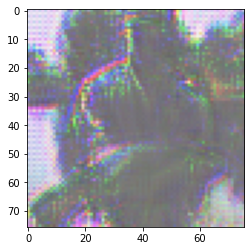

[40/100][0/14]	Loss_D: 1.2052	Loss_G: 0.6560	D(x): 0.5395	D(G(z)): 0.0764 / 0.0762
[40/100][1/14]	Loss_D: 1.2080	Loss_G: 0.6557	D(x): 0.5326	D(G(z)): 0.0771 / 0.0769
[40/100][2/14]	Loss_D: 1.1995	Loss_G: 0.6560	D(x): 0.5575	D(G(z)): 0.0766 / 0.0763
[40/100][3/14]	Loss_D: 1.2059	Loss_G: 0.6579	D(x): 0.5258	D(G(z)): 0.0724 / 0.0721
[40/100][4/14]	Loss_D: 1.2084	Loss_G: 0.6596	D(x): 0.5149	D(G(z)): 0.0688 / 0.0686
[40/100][5/14]	Loss_D: 1.2098	Loss_G: 0.6602	D(x): 0.5118	D(G(z)): 0.0674 / 0.0672
[40/100][6/14]	Loss_D: 1.2059	Loss_G: 0.6588	D(x): 0.5249	D(G(z)): 0.0704 / 0.0702
[40/100][7/14]	Loss_D: 1.2071	Loss_G: 0.6562	D(x): 0.5341	D(G(z)): 0.0761 / 0.0759
[40/100][8/14]	Loss_D: 1.2056	Loss_G: 0.6569	D(x): 0.5340	D(G(z)): 0.0745 / 0.0743
[40/100][9/14]	Loss_D: 1.2139	Loss_G: 0.6591	D(x): 0.5059	D(G(z)): 0.0698 / 0.0697
[40/100][10/14]	Loss_D: 1.2039	Loss_G: 0.6589	D(x): 0.5351	D(G(z)): 0.0703 / 0.0701
[40/100][11/14]	Loss_D: 1.2014	Loss_G: 0.6584	D(x): 0.5413	D(G(z)): 0.0713 / 0.0711
[4

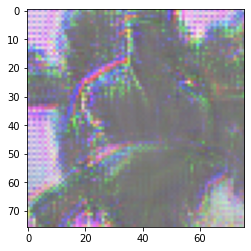

[45/100][0/14]	Loss_D: 1.1868	Loss_G: 0.6591	D(x): 0.5805	D(G(z)): 0.0699 / 0.0696
[45/100][1/14]	Loss_D: 1.1912	Loss_G: 0.6589	D(x): 0.5683	D(G(z)): 0.0703 / 0.0701
[45/100][2/14]	Loss_D: 1.1807	Loss_G: 0.6596	D(x): 0.5975	D(G(z)): 0.0689 / 0.0686
[45/100][3/14]	Loss_D: 1.1870	Loss_G: 0.6607	D(x): 0.5695	D(G(z)): 0.0666 / 0.0663
[45/100][4/14]	Loss_D: 1.1922	Loss_G: 0.6623	D(x): 0.5512	D(G(z)): 0.0631 / 0.0628
[45/100][5/14]	Loss_D: 1.1930	Loss_G: 0.6630	D(x): 0.5495	D(G(z)): 0.0617 / 0.0615
[45/100][6/14]	Loss_D: 1.1881	Loss_G: 0.6618	D(x): 0.5649	D(G(z)): 0.0641 / 0.0638
[45/100][7/14]	Loss_D: 1.1895	Loss_G: 0.6598	D(x): 0.5715	D(G(z)): 0.0685 / 0.0683
[45/100][8/14]	Loss_D: 1.1883	Loss_G: 0.6605	D(x): 0.5707	D(G(z)): 0.0667 / 0.0666
[45/100][9/14]	Loss_D: 1.1976	Loss_G: 0.6622	D(x): 0.5417	D(G(z)): 0.0633 / 0.0631
[45/100][10/14]	Loss_D: 1.1862	Loss_G: 0.6619	D(x): 0.5740	D(G(z)): 0.0638 / 0.0637
[45/100][11/14]	Loss_D: 1.1822	Loss_G: 0.6617	D(x): 0.5839	D(G(z)): 0.0644 / 0.0642
[4

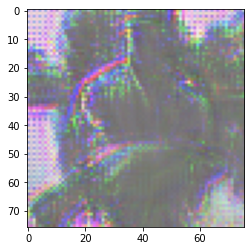

[50/100][0/14]	Loss_D: 1.1675	Loss_G: 0.6640	D(x): 0.6192	D(G(z)): 0.0596 / 0.0594
[50/100][1/14]	Loss_D: 1.1718	Loss_G: 0.6637	D(x): 0.6062	D(G(z)): 0.0601 / 0.0600
[50/100][2/14]	Loss_D: 1.1616	Loss_G: 0.6645	D(x): 0.6346	D(G(z)): 0.0585 / 0.0583
[50/100][3/14]	Loss_D: 1.1694	Loss_G: 0.6650	D(x): 0.6056	D(G(z)): 0.0574 / 0.0573
[50/100][4/14]	Loss_D: 1.1752	Loss_G: 0.6660	D(x): 0.5866	D(G(z)): 0.0553 / 0.0551
[50/100][5/14]	Loss_D: 1.1765	Loss_G: 0.6666	D(x): 0.5839	D(G(z)): 0.0541 / 0.0539
[50/100][6/14]	Loss_D: 1.1702	Loss_G: 0.6659	D(x): 0.6020	D(G(z)): 0.0555 / 0.0553
[50/100][7/14]	Loss_D: 1.1703	Loss_G: 0.6641	D(x): 0.6106	D(G(z)): 0.0592 / 0.0591
[50/100][8/14]	Loss_D: 1.1700	Loss_G: 0.6648	D(x): 0.6083	D(G(z)): 0.0578 / 0.0577
[50/100][9/14]	Loss_D: 1.1808	Loss_G: 0.6660	D(x): 0.5765	D(G(z)): 0.0552 / 0.0551
[50/100][10/14]	Loss_D: 1.1685	Loss_G: 0.6659	D(x): 0.6114	D(G(z)): 0.0556 / 0.0554
[50/100][11/14]	Loss_D: 1.1635	Loss_G: 0.6657	D(x): 0.6238	D(G(z)): 0.0560 / 0.0559
[5

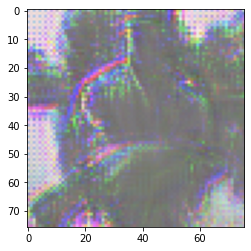

[55/100][0/14]	Loss_D: 1.1534	Loss_G: 0.6670	D(x): 0.6494	D(G(z)): 0.0532 / 0.0530
[55/100][1/14]	Loss_D: 1.1566	Loss_G: 0.6668	D(x): 0.6384	D(G(z)): 0.0535 / 0.0535
[55/100][2/14]	Loss_D: 1.1479	Loss_G: 0.6675	D(x): 0.6634	D(G(z)): 0.0520 / 0.0520
[55/100][3/14]	Loss_D: 1.1567	Loss_G: 0.6678	D(x): 0.6327	D(G(z)): 0.0515 / 0.0515
[55/100][4/14]	Loss_D: 1.1627	Loss_G: 0.6686	D(x): 0.6133	D(G(z)): 0.0498 / 0.0497
[55/100][5/14]	Loss_D: 1.1646	Loss_G: 0.6691	D(x): 0.6098	D(G(z)): 0.0489 / 0.0487
[55/100][6/14]	Loss_D: 1.1565	Loss_G: 0.6686	D(x): 0.6321	D(G(z)): 0.0499 / 0.0498
[55/100][7/14]	Loss_D: 1.1547	Loss_G: 0.6669	D(x): 0.6451	D(G(z)): 0.0534 / 0.0533
[55/100][8/14]	Loss_D: 1.1566	Loss_G: 0.6675	D(x): 0.6368	D(G(z)): 0.0520 / 0.0519
[55/100][9/14]	Loss_D: 1.1685	Loss_G: 0.6687	D(x): 0.6026	D(G(z)): 0.0496 / 0.0495
[55/100][10/14]	Loss_D: 1.1557	Loss_G: 0.6686	D(x): 0.6390	D(G(z)): 0.0500 / 0.0499
[55/100][11/14]	Loss_D: 1.1504	Loss_G: 0.6682	D(x): 0.6526	D(G(z)): 0.0506 / 0.0505
[5

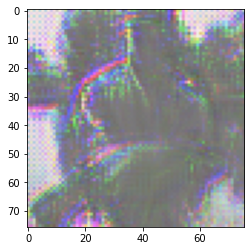

[60/100][0/14]	Loss_D: 1.1424	Loss_G: 0.6688	D(x): 0.6742	D(G(z)): 0.0494 / 0.0493
[60/100][1/14]	Loss_D: 1.1470	Loss_G: 0.6689	D(x): 0.6576	D(G(z)): 0.0492 / 0.0492
[60/100][2/14]	Loss_D: 1.1371	Loss_G: 0.6694	D(x): 0.6876	D(G(z)): 0.0481 / 0.0482
[60/100][3/14]	Loss_D: 1.1478	Loss_G: 0.6693	D(x): 0.6530	D(G(z)): 0.0482 / 0.0482
[60/100][4/14]	Loss_D: 1.1528	Loss_G: 0.6702	D(x): 0.6362	D(G(z)): 0.0465 / 0.0466
[60/100][5/14]	Loss_D: 1.1561	Loss_G: 0.6706	D(x): 0.6292	D(G(z)): 0.0457 / 0.0456
[60/100][6/14]	Loss_D: 1.1472	Loss_G: 0.6702	D(x): 0.6533	D(G(z)): 0.0467 / 0.0466
[60/100][7/14]	Loss_D: 1.1436	Loss_G: 0.6683	D(x): 0.6721	D(G(z)): 0.0505 / 0.0503
[60/100][8/14]	Loss_D: 1.1466	Loss_G: 0.6692	D(x): 0.6598	D(G(z)): 0.0486 / 0.0484
[60/100][9/14]	Loss_D: 1.1586	Loss_G: 0.6705	D(x): 0.6250	D(G(z)): 0.0459 / 0.0458
[60/100][10/14]	Loss_D: 1.1468	Loss_G: 0.6702	D(x): 0.6592	D(G(z)): 0.0466 / 0.0464
[60/100][11/14]	Loss_D: 1.1405	Loss_G: 0.6699	D(x): 0.6758	D(G(z)): 0.0474 / 0.0470
[6

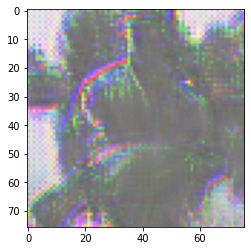

[65/100][0/14]	Loss_D: 1.1350	Loss_G: 0.6700	D(x): 0.6912	D(G(z)): 0.0469 / 0.0470
[65/100][1/14]	Loss_D: 1.1430	Loss_G: 0.6705	D(x): 0.6629	D(G(z)): 0.0461 / 0.0458
[65/100][2/14]	Loss_D: 1.1285	Loss_G: 0.6709	D(x): 0.7074	D(G(z)): 0.0452 / 0.0451
[65/100][3/14]	Loss_D: 1.1400	Loss_G: 0.6708	D(x): 0.6706	D(G(z)): 0.0452 / 0.0453
[65/100][4/14]	Loss_D: 1.1455	Loss_G: 0.6716	D(x): 0.6526	D(G(z)): 0.0434 / 0.0437
[65/100][5/14]	Loss_D: 1.1498	Loss_G: 0.6720	D(x): 0.6425	D(G(z)): 0.0427 / 0.0427
[65/100][6/14]	Loss_D: 1.1409	Loss_G: 0.6715	D(x): 0.6671	D(G(z)): 0.0438 / 0.0438
[65/100][7/14]	Loss_D: 1.1366	Loss_G: 0.6695	D(x): 0.6886	D(G(z)): 0.0482 / 0.0480
[65/100][8/14]	Loss_D: 1.1398	Loss_G: 0.6706	D(x): 0.6749	D(G(z)): 0.0459 / 0.0456
[65/100][9/14]	Loss_D: 1.1518	Loss_G: 0.6723	D(x): 0.6390	D(G(z)): 0.0424 / 0.0422
[65/100][10/14]	Loss_D: 1.1403	Loss_G: 0.6719	D(x): 0.6728	D(G(z)): 0.0435 / 0.0431
[65/100][11/14]	Loss_D: 1.1332	Loss_G: 0.6716	D(x): 0.6921	D(G(z)): 0.0442 / 0.0437
[6

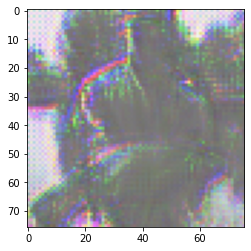

[70/100][0/14]	Loss_D: 1.1273	Loss_G: 0.6715	D(x): 0.7079	D(G(z)): 0.0437 / 0.0439
[70/100][1/14]	Loss_D: 1.1367	Loss_G: 0.6725	D(x): 0.6749	D(G(z)): 0.0425 / 0.0418
[70/100][2/14]	Loss_D: 1.1203	Loss_G: 0.6727	D(x): 0.7258	D(G(z)): 0.0416 / 0.0413
[70/100][3/14]	Loss_D: 1.1319	Loss_G: 0.6727	D(x): 0.6879	D(G(z)): 0.0412 / 0.0413
[70/100][4/14]	Loss_D: 1.1373	Loss_G: 0.6735	D(x): 0.6698	D(G(z)): 0.0394 / 0.0397
[70/100][5/14]	Loss_D: 1.1427	Loss_G: 0.6740	D(x): 0.6566	D(G(z)): 0.0386 / 0.0387
[70/100][6/14]	Loss_D: 1.1338	Loss_G: 0.6734	D(x): 0.6819	D(G(z)): 0.0399 / 0.0400
[70/100][7/14]	Loss_D: 1.1288	Loss_G: 0.6714	D(x): 0.7047	D(G(z)): 0.0442 / 0.0440
[70/100][8/14]	Loss_D: 1.1319	Loss_G: 0.6726	D(x): 0.6914	D(G(z)): 0.0419 / 0.0416
[70/100][9/14]	Loss_D: 1.1442	Loss_G: 0.6743	D(x): 0.6542	D(G(z)): 0.0383 / 0.0382
[70/100][10/14]	Loss_D: 1.1325	Loss_G: 0.6738	D(x): 0.6890	D(G(z)): 0.0395 / 0.0391
[70/100][11/14]	Loss_D: 1.1253	Loss_G: 0.6735	D(x): 0.7090	D(G(z)): 0.0401 / 0.0397
[7

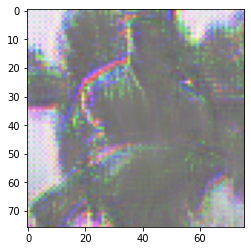

[75/100][0/14]	Loss_D: 1.1203	Loss_G: 0.6729	D(x): 0.7235	D(G(z)): 0.0406 / 0.0410
[75/100][1/14]	Loss_D: 1.1297	Loss_G: 0.6743	D(x): 0.6896	D(G(z)): 0.0391 / 0.0380
[75/100][2/14]	Loss_D: 1.1131	Loss_G: 0.6745	D(x): 0.7413	D(G(z)): 0.0382 / 0.0376
[75/100][3/14]	Loss_D: 1.1248	Loss_G: 0.6746	D(x): 0.7026	D(G(z)): 0.0373 / 0.0374
[75/100][4/14]	Loss_D: 1.1296	Loss_G: 0.6753	D(x): 0.6864	D(G(z)): 0.0356 / 0.0359
[75/100][5/14]	Loss_D: 1.1360	Loss_G: 0.6758	D(x): 0.6702	D(G(z)): 0.0348 / 0.0350
[75/100][6/14]	Loss_D: 1.1270	Loss_G: 0.6751	D(x): 0.6958	D(G(z)): 0.0363 / 0.0364
[75/100][7/14]	Loss_D: 1.1214	Loss_G: 0.6732	D(x): 0.7203	D(G(z)): 0.0406 / 0.0404
[75/100][8/14]	Loss_D: 1.1246	Loss_G: 0.6744	D(x): 0.7072	D(G(z)): 0.0384 / 0.0379
[75/100][9/14]	Loss_D: 1.1374	Loss_G: 0.6761	D(x): 0.6681	D(G(z)): 0.0346 / 0.0344
[75/100][10/14]	Loss_D: 1.1250	Loss_G: 0.6757	D(x): 0.7045	D(G(z)): 0.0357 / 0.0353
[75/100][11/14]	Loss_D: 1.1178	Loss_G: 0.6754	D(x): 0.7245	D(G(z)): 0.0362 / 0.0358
[7

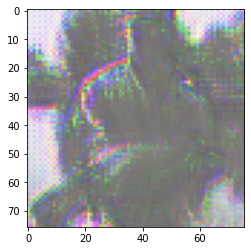

[80/100][0/14]	Loss_D: 1.1142	Loss_G: 0.6743	D(x): 0.7372	D(G(z)): 0.0382 / 0.0382
[80/100][1/14]	Loss_D: 1.1231	Loss_G: 0.6760	D(x): 0.7037	D(G(z)): 0.0360 / 0.0347
[80/100][2/14]	Loss_D: 1.1070	Loss_G: 0.6760	D(x): 0.7538	D(G(z)): 0.0347 / 0.0345
[80/100][3/14]	Loss_D: 1.1187	Loss_G: 0.6759	D(x): 0.7155	D(G(z)): 0.0341 / 0.0348
[80/100][4/14]	Loss_D: 1.1241	Loss_G: 0.6764	D(x): 0.6986	D(G(z)): 0.0331 / 0.0339
[80/100][5/14]	Loss_D: 1.1308	Loss_G: 0.6769	D(x): 0.6810	D(G(z)): 0.0324 / 0.0327
[80/100][6/14]	Loss_D: 1.1225	Loss_G: 0.6760	D(x): 0.7061	D(G(z)): 0.0345 / 0.0346
[80/100][7/14]	Loss_D: 1.1170	Loss_G: 0.6739	D(x): 0.7317	D(G(z)): 0.0398 / 0.0389
[80/100][8/14]	Loss_D: 1.1194	Loss_G: 0.6756	D(x): 0.7195	D(G(z)): 0.0367 / 0.0355
[80/100][9/14]	Loss_D: 1.1317	Loss_G: 0.6776	D(x): 0.6798	D(G(z)): 0.0318 / 0.0314
[80/100][10/14]	Loss_D: 1.1185	Loss_G: 0.6772	D(x): 0.7186	D(G(z)): 0.0327 / 0.0322
[80/100][11/14]	Loss_D: 1.1111	Loss_G: 0.6770	D(x): 0.7391	D(G(z)): 0.0329 / 0.0326
[8

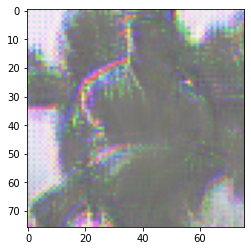

[85/100][0/14]	Loss_D: 1.1096	Loss_G: 0.6749	D(x): 0.7489	D(G(z)): 0.0376 / 0.0369
[85/100][1/14]	Loss_D: 1.1191	Loss_G: 0.6770	D(x): 0.7129	D(G(z)): 0.0346 / 0.0326
[85/100][2/14]	Loss_D: 1.1022	Loss_G: 0.6771	D(x): 0.7646	D(G(z)): 0.0327 / 0.0323
[85/100][3/14]	Loss_D: 1.1137	Loss_G: 0.6770	D(x): 0.7260	D(G(z)): 0.0318 / 0.0326
[85/100][4/14]	Loss_D: 1.1189	Loss_G: 0.6772	D(x): 0.7105	D(G(z)): 0.0310 / 0.0323
[85/100][5/14]	Loss_D: 1.1258	Loss_G: 0.6776	D(x): 0.6928	D(G(z)): 0.0306 / 0.0314
[85/100][6/14]	Loss_D: 1.1184	Loss_G: 0.6762	D(x): 0.7166	D(G(z)): 0.0337 / 0.0342
[85/100][7/14]	Loss_D: 1.1138	Loss_G: 0.6737	D(x): 0.7425	D(G(z)): 0.0410 / 0.0395
[85/100][8/14]	Loss_D: 1.1157	Loss_G: 0.6759	D(x): 0.7304	D(G(z)): 0.0370 / 0.0349
[85/100][9/14]	Loss_D: 1.1267	Loss_G: 0.6785	D(x): 0.6914	D(G(z)): 0.0302 / 0.0296
[85/100][10/14]	Loss_D: 1.1134	Loss_G: 0.6782	D(x): 0.7305	D(G(z)): 0.0309 / 0.0301
[85/100][11/14]	Loss_D: 1.1052	Loss_G: 0.6780	D(x): 0.7530	D(G(z)): 0.0308 / 0.0306
[8

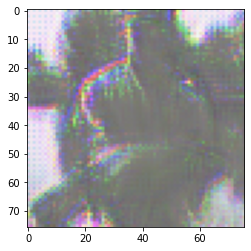

[90/100][0/14]	Loss_D: 1.1057	Loss_G: 0.6756	D(x): 0.7590	D(G(z)): 0.0373 / 0.0354
[90/100][1/14]	Loss_D: 1.1129	Loss_G: 0.6781	D(x): 0.7283	D(G(z)): 0.0328 / 0.0304
[90/100][2/14]	Loss_D: 1.0979	Loss_G: 0.6781	D(x): 0.7736	D(G(z)): 0.0304 / 0.0303
[90/100][3/14]	Loss_D: 1.1095	Loss_G: 0.6779	D(x): 0.7348	D(G(z)): 0.0295 / 0.0307
[90/100][4/14]	Loss_D: 1.1148	Loss_G: 0.6779	D(x): 0.7196	D(G(z)): 0.0292 / 0.0307
[90/100][5/14]	Loss_D: 1.1215	Loss_G: 0.6784	D(x): 0.7024	D(G(z)): 0.0289 / 0.0298
[90/100][6/14]	Loss_D: 1.1150	Loss_G: 0.6769	D(x): 0.7243	D(G(z)): 0.0325 / 0.0328
[90/100][7/14]	Loss_D: 1.1105	Loss_G: 0.6744	D(x): 0.7512	D(G(z)): 0.0403 / 0.0380
[90/100][8/14]	Loss_D: 1.1122	Loss_G: 0.6769	D(x): 0.7389	D(G(z)): 0.0357 / 0.0329
[90/100][9/14]	Loss_D: 1.1220	Loss_G: 0.6796	D(x): 0.7017	D(G(z)): 0.0280 / 0.0273
[90/100][10/14]	Loss_D: 1.1084	Loss_G: 0.6793	D(x): 0.7409	D(G(z)): 0.0283 / 0.0278
[90/100][11/14]	Loss_D: 1.1002	Loss_G: 0.6790	D(x): 0.7636	D(G(z)): 0.0283 / 0.0285
[9

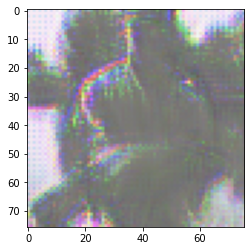

[95/100][0/14]	Loss_D: 1.1023	Loss_G: 0.6763	D(x): 0.7680	D(G(z)): 0.0370 / 0.0341
[95/100][1/14]	Loss_D: 1.1082	Loss_G: 0.6787	D(x): 0.7395	D(G(z)): 0.0315 / 0.0290
[95/100][2/14]	Loss_D: 1.0934	Loss_G: 0.6788	D(x): 0.7842	D(G(z)): 0.0289 / 0.0290
[95/100][3/14]	Loss_D: 1.1053	Loss_G: 0.6785	D(x): 0.7446	D(G(z)): 0.0281 / 0.0295
[95/100][4/14]	Loss_D: 1.1106	Loss_G: 0.6785	D(x): 0.7298	D(G(z)): 0.0280 / 0.0296
[95/100][5/14]	Loss_D: 1.1175	Loss_G: 0.6789	D(x): 0.7122	D(G(z)): 0.0276 / 0.0287
[95/100][6/14]	Loss_D: 1.1109	Loss_G: 0.6774	D(x): 0.7350	D(G(z)): 0.0316 / 0.0318
[95/100][7/14]	Loss_D: 1.1063	Loss_G: 0.6751	D(x): 0.7624	D(G(z)): 0.0397 / 0.0367
[95/100][8/14]	Loss_D: 1.1072	Loss_G: 0.6777	D(x): 0.7514	D(G(z)): 0.0345 / 0.0312
[95/100][9/14]	Loss_D: 1.1166	Loss_G: 0.6803	D(x): 0.7150	D(G(z)): 0.0264 / 0.0259
[95/100][10/14]	Loss_D: 1.1028	Loss_G: 0.6800	D(x): 0.7543	D(G(z)): 0.0266 / 0.0266
[95/100][11/14]	Loss_D: 1.0949	Loss_G: 0.6794	D(x): 0.7769	D(G(z)): 0.0269 / 0.0276
[9

In [ ]:
#Select device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

# Training Loop
real_label= 1.
fake_label= 0.

#Loss criterion
criterion = nn.BCEWithLogitsLoss()

# Lists to keep track of progress
SimpleSGD_img_list = []
SimpleSGD_G_losses = []
SimpleSGD_D_losses = []

num_epochs = 100

#define models and move to
G = SimplifiedUNET().to(device)
G = G.apply(weights_init)
D = SimplifiedPatchGAN(divisor=2).to(device)
D = D.apply(weights_init)

# Setup ptimizers for both G and D
optimizerD = optim.SGD(D.parameters(), momentum=0.9, lr=0.0002)
optimizerG = optim.SGD(G.parameters(), momentum=0.9,lr=0.0002)

print("Starting Training Loop...")

#Loop over epochs
for epoch in range(num_epochs):

    #define iterators and their length
    iterator_rgb = iter(train_rgb_loader)
    rgb_len = len(iterator_rgb)
    iterator_bw = iter(train_bw_loader)
    bw_len = len(iterator_bw) 

    #Loop over batches
    G_batch_loss = []
    D_batch_loss = []
    for i in range(rgb_len-1):

        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        
        ## Train with all-real batch
        D.zero_grad()

        # Select batch and move to device
        batch_rgb,_ = next(iterator_rgb)
        batch_bw,_ = next(iterator_bw)
        batch_bw = batch_bw.to(device)
        batch_rgb = batch_rgb.to(device)

        # Generate fake image batch with G
        generated = G(batch_bw)
        image_size = generated.size()[-1]

        #center crop original batches
        batch_rgb = T.functional.center_crop(batch_rgb,(image_size,image_size))
        batch_bw = T.functional.center_crop(batch_bw,(image_size,image_size))


        #define tensor of real_label values
        b_size = batch_rgb.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

        # Forward pass real batch through D
        real_pair = torch.cat((batch_rgb,batch_bw),1) #x and y
        output = D(real_pair).view(-1)

        # Calculate loss on all-real batch
        errD_real = criterion(output, label)

        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        
        #store image every 100 epochs   
        if i==0 and epoch%5==0:
          plt.imshow(generated[0].permute(1,2,0).cpu().detach().numpy())
          plt.show()
          SimpleSGD_img_list.append(generated[0].permute(1,2,0).cpu().detach().numpy())

        #generate fake_label tensor
        label.fill_(fake_label)

        # Classify all fake batch with D
        fake_pair = torch.cat((generated,batch_bw),1)
        output = D(fake_pair.detach()).view(-1)

        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)

        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        
        # Update D
        optimizerD.step()

        # (2) Update G network: maximize log(D(G(z)))

        G.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost

        #perform another forward pass of all-fake batch through D
        output = D(fake_pair).view(-1)

        # Calculate G's loss based on this output
        errG = criterion(output, label)
        errG.backward()

        L1_term = 0.5*generator_regularization(generated,batch_rgb,device)
        L1_term.backward()

        errg = errG + L1_term

        D_G_z2 = output.mean().item()

        # Update G
        optimizerG.step()

        # Output training stats
        print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
              % (epoch, num_epochs, i, len(iterator_rgb)-2,
                  errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_batch_loss.append(errG.item())
        D_batch_loss.append(errD.item())

    # Save network parameters at the end of epochs
    torch.save(G.state_dict(), 'G_SimpleSGD_params.pth')
    torch.save(D.state_dict(), 'D_SimpleSGD_params.pth')
      
    SimpleSGD_G_losses.append(np.mean(G_batch_loss))
    SimpleSGD_D_losses.append(np.mean(D_batch_loss))

### Plot Learning curves comparison

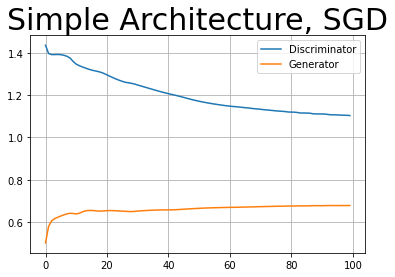

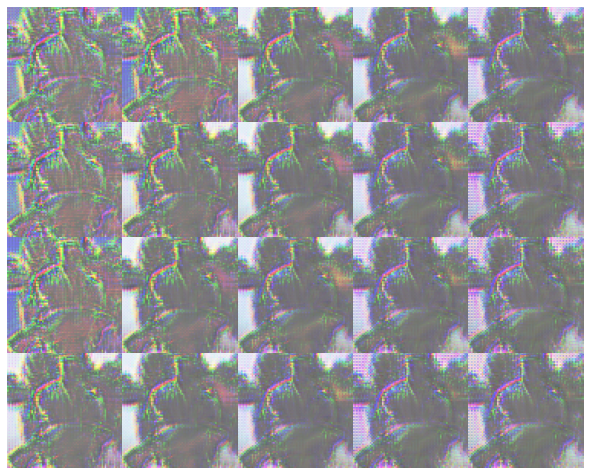

In [ ]:
#SGD_G_losses #len 100
#SGD_D_losses 

#Learning curves
plt.figure()
plt.plot(SimpleSGD_D_losses,label="Discriminator")
plt.plot(SimpleSGD_G_losses,label="Generator")
plt.legend()
plt.title("Simple Architecture, SGD",fontsize=30)
plt.savefig("SimpleSGD_curevs.png")
plt.grid()
plt.show()

#SGD_img_list #len=20
#plot images
#fig params
rows = 4
columns = 5
heights = np.repeat(5,rows)
widths = np.repeat(5,columns)
fig_width = 8.
fig_height = fig_width * sum(heights) / sum(widths)
fig,ax = plt.subplots(rows,columns,figsize=(fig_width, fig_height),gridspec_kw={'height_ratios':heights})

for i in range(rows):
    for j in range(columns):
        ax[i,j].imshow(SimpleSGD_img_list[i+2*j])
        ax[i,j].axis('off')
        
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.savefig("SimpleSGD_image_generation.png")
plt.show()


## SGD

cuda
Starting Training Loop...


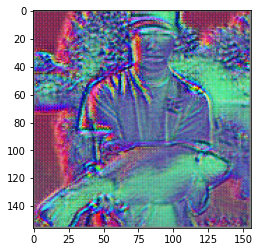

[0/20][0/94]	Loss_D: 1.4799	Loss_G: 0.4780	D(x): 0.6103	D(G(z)): 0.6112 / 0.4903
[0/20][1/94]	Loss_D: 1.4385	Loss_G: 0.5139	D(x): 0.4971	D(G(z)): 0.4819 / 0.3980
[0/20][2/94]	Loss_D: 1.4253	Loss_G: 0.5376	D(x): 0.4153	D(G(z)): 0.4086 / 0.3401
[0/20][3/94]	Loss_D: 1.4066	Loss_G: 0.5661	D(x): 0.3548	D(G(z)): 0.3356 / 0.2729
[0/20][4/94]	Loss_D: 1.3951	Loss_G: 0.5889	D(x): 0.2987	D(G(z)): 0.2745 / 0.2211
[0/20][5/94]	Loss_D: 1.3863	Loss_G: 0.6081	D(x): 0.2503	D(G(z)): 0.2218 / 0.1783
[0/20][6/94]	Loss_D: 1.3810	Loss_G: 0.6232	D(x): 0.2092	D(G(z)): 0.1789 / 0.1455
[0/20][7/94]	Loss_D: 1.3760	Loss_G: 0.6357	D(x): 0.1788	D(G(z)): 0.1444 / 0.1186
[0/20][8/94]	Loss_D: 1.3763	Loss_G: 0.6435	D(x): 0.1516	D(G(z)): 0.1214 / 0.1021
[0/20][9/94]	Loss_D: 1.3754	Loss_G: 0.6496	D(x): 0.1338	D(G(z)): 0.1041 / 0.0893
[0/20][10/94]	Loss_D: 1.3741	Loss_G: 0.6549	D(x): 0.1203	D(G(z)): 0.0896 / 0.0782
[0/20][11/94]	Loss_D: 1.3738	Loss_G: 0.6591	D(x): 0.1082	D(G(z)): 0.0782 / 0.0694
[0/20][12/94]	Loss_D: 1.36

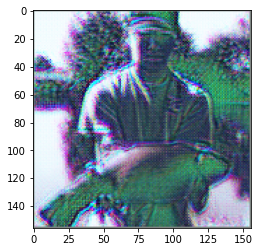

[5/20][0/94]	Loss_D: 1.1592	Loss_G: 0.6731	D(x): 0.6160	D(G(z)): 0.0430 / 0.0406
[5/20][1/94]	Loss_D: 1.1581	Loss_G: 0.6778	D(x): 0.6086	D(G(z)): 0.0327 / 0.0310
[5/20][2/94]	Loss_D: 1.1498	Loss_G: 0.6810	D(x): 0.6194	D(G(z)): 0.0247 / 0.0246
[5/20][3/94]	Loss_D: 1.1376	Loss_G: 0.6818	D(x): 0.6552	D(G(z)): 0.0230 / 0.0229
[5/20][4/94]	Loss_D: 1.1417	Loss_G: 0.6797	D(x): 0.6450	D(G(z)): 0.0277 / 0.0272
[5/20][5/94]	Loss_D: 1.1151	Loss_G: 0.6806	D(x): 0.7133	D(G(z)): 0.0254 / 0.0254
[5/20][6/94]	Loss_D: 1.1342	Loss_G: 0.6811	D(x): 0.6577	D(G(z)): 0.0238 / 0.0243
[5/20][7/94]	Loss_D: 1.1347	Loss_G: 0.6807	D(x): 0.6585	D(G(z)): 0.0243 / 0.0252
[5/20][8/94]	Loss_D: 1.1382	Loss_G: 0.6755	D(x): 0.6647	D(G(z)): 0.0346 / 0.0358
[5/20][9/94]	Loss_D: 1.1156	Loss_G: 0.6740	D(x): 0.7332	D(G(z)): 0.0381 / 0.0389
[5/20][10/94]	Loss_D: 1.1106	Loss_G: 0.6722	D(x): 0.7634	D(G(z)): 0.0433 / 0.0426
[5/20][11/94]	Loss_D: 1.1428	Loss_G: 0.6735	D(x): 0.6660	D(G(z)): 0.0409 / 0.0400
[5/20][12/94]	Loss_D: 1.12

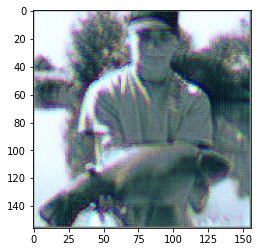

[10/20][0/94]	Loss_D: 1.1063	Loss_G: 0.6851	D(x): 0.7305	D(G(z)): 0.0156 / 0.0163
[10/20][1/94]	Loss_D: 1.1078	Loss_G: 0.6836	D(x): 0.7273	D(G(z)): 0.0162 / 0.0195
[10/20][2/94]	Loss_D: 1.1352	Loss_G: 0.6864	D(x): 0.6601	D(G(z)): 0.0231 / 0.0136
[10/20][3/94]	Loss_D: 1.1013	Loss_G: 0.6881	D(x): 0.7488	D(G(z)): 0.0165 / 0.0102
[10/20][4/94]	Loss_D: 1.1052	Loss_G: 0.6752	D(x): 0.7399	D(G(z)): 0.0222 / 0.0364
[10/20][5/94]	Loss_D: 1.0890	Loss_G: 0.6758	D(x): 0.7920	D(G(z)): 0.0259 / 0.0351
[10/20][6/94]	Loss_D: 1.0930	Loss_G: 0.6852	D(x): 0.7652	D(G(z)): 0.0142 / 0.0161
[10/20][7/94]	Loss_D: 1.0987	Loss_G: 0.6771	D(x): 0.7728	D(G(z)): 0.0329 / 0.0325
[10/20][8/94]	Loss_D: 1.0900	Loss_G: 0.6846	D(x): 0.7802	D(G(z)): 0.0177 / 0.0171
[10/20][9/94]	Loss_D: 1.1035	Loss_G: 0.6755	D(x): 0.7957	D(G(z)): 0.0563 / 0.0357
[10/20][10/94]	Loss_D: 1.1125	Loss_G: 0.6793	D(x): 0.8002	D(G(z)): 0.0702 / 0.0284
[10/20][11/94]	Loss_D: 1.1075	Loss_G: 0.6837	D(x): 0.7319	D(G(z)): 0.0168 / 0.0195
[10/20][12/94]

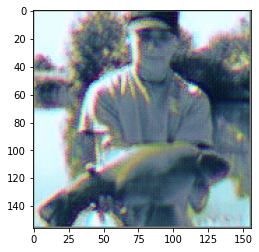

[15/20][0/94]	Loss_D: 1.0929	Loss_G: 0.6821	D(x): 0.7899	D(G(z)): 0.0223 / 0.0224
[15/20][1/94]	Loss_D: 1.0705	Loss_G: 0.6842	D(x): 0.8504	D(G(z)): 0.0185 / 0.0182
[15/20][2/94]	Loss_D: 1.0787	Loss_G: 0.6837	D(x): 0.8191	D(G(z)): 0.0192 / 0.0191
[15/20][3/94]	Loss_D: 1.0812	Loss_G: 0.6852	D(x): 0.8058	D(G(z)): 0.0159 / 0.0160
[15/20][4/94]	Loss_D: 1.0945	Loss_G: 0.6859	D(x): 0.7618	D(G(z)): 0.0150 / 0.0146
[15/20][5/94]	Loss_D: 1.0889	Loss_G: 0.6849	D(x): 0.7846	D(G(z)): 0.0182 / 0.0167
[15/20][6/94]	Loss_D: 1.0862	Loss_G: 0.6855	D(x): 0.7948	D(G(z)): 0.0195 / 0.0154
[15/20][7/94]	Loss_D: 1.0734	Loss_G: 0.6855	D(x): 0.8257	D(G(z)): 0.0140 / 0.0154
[15/20][8/94]	Loss_D: 1.0668	Loss_G: 0.6852	D(x): 0.8468	D(G(z)): 0.0159 / 0.0162
[15/20][9/94]	Loss_D: 1.0745	Loss_G: 0.6780	D(x): 0.8480	D(G(z)): 0.0303 / 0.0308
[15/20][10/94]	Loss_D: 1.1024	Loss_G: 0.6766	D(x): 0.7937	D(G(z)): 0.0481 / 0.0339
[15/20][11/94]	Loss_D: 1.0836	Loss_G: 0.6819	D(x): 0.8168	D(G(z)): 0.0286 / 0.0231
[15/20][12/94]

In [ ]:
#Select device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

# Training Loop
real_label= 1.
fake_label= 0.

#Loss criterion
criterion = nn.BCEWithLogitsLoss()

# Lists to keep track of progress
SGD_img_list = []
SGD_G_losses = []
SGD_D_losses = []

num_epochs = 20

#define models and move to
G = UNET().to(device)
G = G.apply(weights_init)
D = PatchGAN(divisor=2).to(device)
D = D.apply(weights_init)

# Setup ptimizers for both G and D
optimizerD = optim.SGD(D.parameters(), momentum=0.9, lr=0.0002)
optimizerG = optim.SGD(G.parameters(), momentum=0.9, lr=0.0002)

print("Starting Training Loop...")

#Loop over epochs
for epoch in range(num_epochs):

    #define iterators and their length
    iterator_rgb = iter(train_rgb_loader)
    rgb_len = len(iterator_rgb)
    iterator_bw = iter(train_bw_loader)
    bw_len = len(iterator_bw) 

    #Loop over batches
    G_batch_loss = []
    D_batch_loss = []
    for i in range(rgb_len-1):

        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        
        ## Train with all-real batch
        D.zero_grad()

        # Select batch and move to device
        batch_rgb,_ = next(iterator_rgb)
        batch_bw,_ = next(iterator_bw)
        batch_bw = batch_bw.to(device)
        batch_rgb = batch_rgb.to(device)

        # Generate fake image batch with G
        generated = G(batch_bw)
        image_size = generated.size()[-1]

        #center crop original batches
        batch_rgb = T.functional.center_crop(batch_rgb,(image_size,image_size))
        batch_bw = T.functional.center_crop(batch_bw,(image_size,image_size))


        #define tensor of real_label values
        b_size = batch_rgb.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

        # Forward pass real batch through D
        real_pair = torch.cat((batch_rgb,batch_bw),1) #x and y
        output = D(real_pair).view(-1)

        # Calculate loss on all-real batch
        errD_real = criterion(output, label)

        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        
        #store image every 100 epochs   
        if i==0 and epoch%5==0:
          plt.imshow(generated[0].permute(1,2,0).cpu().detach().numpy())
          plt.show()
          SGD_img_list.append(generated[0].permute(1,2,0).cpu().detach().numpy())

        #generate fake_label tensor
        label.fill_(fake_label)

        # Classify all fake batch with D
        fake_pair = torch.cat((generated,batch_bw),1)
        output = D(fake_pair.detach()).view(-1)

        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)

        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        
        # Update D
        optimizerD.step()

        # (2) Update G network: maximize log(D(G(z)))

        G.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost

        #perform another forward pass of all-fake batch through D
        output = D(fake_pair).view(-1)

        # Calculate G's loss based on this output
        errG = criterion(output, label)
        errG.backward()

        L1_term = 0.5*generator_regularization(generated,batch_rgb,device)
        L1_term.backward()

        errg = errG + L1_term

        D_G_z2 = output.mean().item()

        # Update G
        optimizerG.step()

        # Output training stats
        print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
              % (epoch, num_epochs, i, len(iterator_rgb)-2,
                  errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_batch_loss.append(errG.item())
        D_batch_loss.append(errD.item())



    # Save network parameters at the end of epochs
    torch.save(G.state_dict(), 'G_SGD_params.pth')
    torch.save(D.state_dict(), 'D_SGD_params.pth')
      
    SGD_G_losses.append(np.mean(G_batch_loss))
    SGD_D_losses.append(np.mean(D_batch_loss))

### Plot Learning curves

4


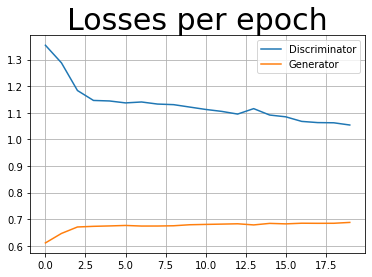

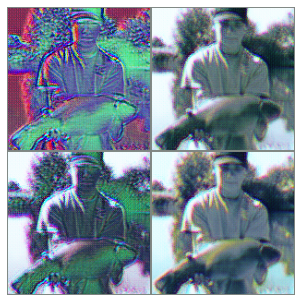

In [ ]:
print(len(SGD_img_list))
#SGD_G_losses #len 100
#SGD_D_losses 

#Learning curves
plt.figure()
plt.plot(SGD_D_losses,label="Discriminator")
plt.plot(SGD_G_losses,label="Generator")
plt.legend()
plt.title("Losses per epoch",fontsize=30)
plt.savefig("SGD_curves.png")
plt.grid()
plt.show()

#SGD_img_list #len=20
#plot images
#fig params
rows = 2
columns = 2
heights = np.repeat(5,rows)
widths = np.repeat(5,columns)
fig_width = 4.
fig_height = fig_width * sum(heights) / sum(widths)
fig,ax = plt.subplots(rows,columns,figsize=(fig_width, fig_height),gridspec_kw={'height_ratios':heights})

for i in range(rows):
    for j in range(columns):
        ax[i,j].imshow(SGD_img_list[i+2*j])
        ax[i,j].axis('off')
        
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.savefig("SGD_image_generation.png")
plt.show()

#6) Compare Discriminator accuracies vs patch dimension


In [ ]:
#Select device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

# Training Loop
real_label= 1.
fake_label= 0.

#Loss criterion
criterion = nn.BCEWithLogitsLoss()

divisors = [2, 4, 6]
div_img_list = []
div_G_losses = []
div_D_losses = []
for i,div in enumerate(divisors):

  # Lists to keep track of progress
  img_list = []
  G_losses = []
  D_losses = []

  num_epochs = 10

  #define models and move to
  G = UNET().to(device)
  G = G.apply(weights_init)
  D = PatchGAN(divisor=div).to(device)
  D = D.apply(weights_init)

  # Setup ptimizers for both G and D
  optimizerD = optim.Adam(D.parameters(),lr=0.0001,betas=(0.5,0.999))
  optimizerG = optim.Adam(G.parameters(),lr=0.0001,betas=(0.5,0.999))

  print(f"Div={div}. Starting Training Loop...")

  #Loop over epochs
  for epoch in range(num_epochs):

      #define iterators and their length
      iterator_rgb = iter(train_rgb_loader)
      rgb_len = len(iterator_rgb)
      iterator_bw = iter(train_bw_loader)
      bw_len = len(iterator_bw) 

      #Loop over batches
      G_batch_loss = []
      D_batch_loss = []
      for i in range(rgb_len-1):

        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        
        ## Train with all-real batch
        D.zero_grad()

        # Select batch and move to device
        batch_rgb,_ = next(iterator_rgb)
        batch_bw,_ = next(iterator_bw)
        batch_bw = batch_bw.to(device)
        batch_rgb = batch_rgb.to(device)

        # Generate fake image batch with G
        generated = G(batch_bw)
        image_size = generated.size()[-1]

        #center crop original batches
        batch_rgb = T.functional.center_crop(batch_rgb,(image_size,image_size))
        batch_bw = T.functional.center_crop(batch_bw,(image_size,image_size))

        #define tensor of real_label values
        b_size = batch_rgb.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

        # Forward pass real batch through D
        real_pair = torch.cat((batch_rgb,batch_bw),1) #x and y
        output = D(real_pair).view(-1)

        # Calculate loss on all-real batch
        errD_real = criterion(output, label)

        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        
        #store image every 100 epochs   
        if i==0 and epoch%5==0:
          img_list.append(generated[0].permute(1,2,0).cpu().detach().numpy())

        #generate fake_label tensor
        label.fill_(fake_label)

        # Classify all fake batch with D
        fake_pair = torch.cat((generated,batch_bw),1)
        output = D(fake_pair.detach()).view(-1)

        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)

        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        
        # Update D
        optimizerD.step()

        # (2) Update G network: maximize log(D(G(z)))

        G.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost

        #perform another forward pass of all-fake batch through D
        output = D(fake_pair).view(-1)

        # Calculate G's loss based on this output
        errG = criterion(output, label)
        errG.backward()

        L1_term = generator_regularization(generated,batch_rgb,device)
        L1_term.backward()

        errg = errG + L1_term

        D_G_z2 = output.mean().item()

        # Update G
        optimizerG.step()

        # Output training stats
        print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
              % (epoch, num_epochs, i, len(iterator_rgb)-2,
                  errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_batch_loss.append(errG.item())
        D_batch_loss.append(errD.item())

      G_losses.append(np.mean(G_batch_loss))
      D_losses.append(np.mean(D_batch_loss))


  div_img_list.append(img_list)
  div_G_losses.append(G_losses)
  div_D_losses.append(D_losses)

  torch.cuda.empty_cache()

cuda
Div=2. Starting Training Loop...
[0/10][0/94]	Loss_D: 1.4441	Loss_G: 0.6908	D(x): 0.5454	D(G(z)): 0.5187 / 0.0048
[0/10][1/94]	Loss_D: 1.3862	Loss_G: 0.6920	D(x): 0.0143	D(G(z)): 0.0139 / 0.0023
[0/10][2/94]	Loss_D: 1.3865	Loss_G: 0.6923	D(x): 0.0045	D(G(z)): 0.0049 / 0.0017
[0/10][3/94]	Loss_D: 1.3868	Loss_G: 0.6927	D(x): 0.0014	D(G(z)): 0.0023 / 0.0010
[0/10][4/94]	Loss_D: 1.3869	Loss_G: 0.6926	D(x): 0.0010	D(G(z)): 0.0022 / 0.0010
[0/10][5/94]	Loss_D: 1.3868	Loss_G: 0.6927	D(x): 0.0008	D(G(z)): 0.0017 / 0.0009
[0/10][6/94]	Loss_D: 1.3874	Loss_G: 0.6927	D(x): 0.0005	D(G(z)): 0.0027 / 0.0010
[0/10][7/94]	Loss_D: 1.3869	Loss_G: 0.6929	D(x): 0.0003	D(G(z)): 0.0016 / 0.0006
[0/10][8/94]	Loss_D: 1.3870	Loss_G: 0.6929	D(x): 0.0003	D(G(z)): 0.0017 / 0.0005
[0/10][9/94]	Loss_D: 1.3865	Loss_G: 0.6930	D(x): 0.0002	D(G(z)): 0.0007 / 0.0003
[0/10][10/94]	Loss_D: 1.3865	Loss_G: 0.6930	D(x): 0.0002	D(G(z)): 0.0005 / 0.0002
[0/10][11/94]	Loss_D: 1.3864	Loss_G: 0.6931	D(x): 0.0001	D(G(z)): 0.00

## Plot Comparison

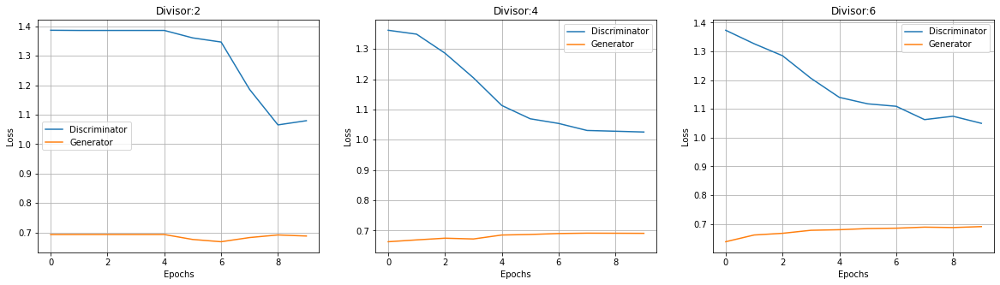

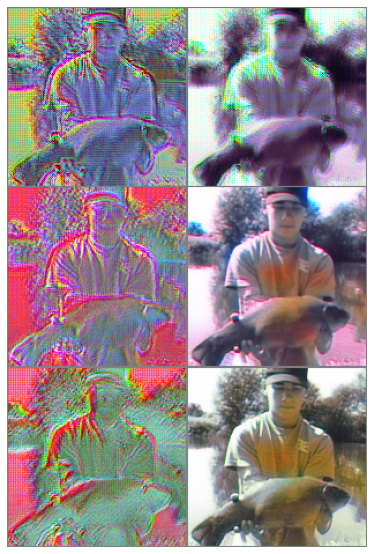

In [ ]:


fig,ax = plt.subplots(1,3,figsize=(20,5))
for i in range(3):

  #Learning curves
  ax[i].plot(div_D_losses[i],label="Discriminator")
  ax[i].plot(div_G_losses[i],label="Generator")
  ax[i].legend()
  ax[i].set_title(f"Divisor:{divisors[i]}")
  plt.savefig("divisors_curves.png")
  ax[i].set_xlabel("Epochs")
  ax[i].set_ylabel("Loss")
  ax[i].grid()
plt.show()


rows = 3
columns = 2
heights = np.repeat(5,rows)
widths = np.repeat(5,columns)
fig_width = 5.
fig_height = fig_width * sum(heights) / sum(widths)
fig,ax = plt.subplots(rows,columns,figsize=(fig_width, fig_height),gridspec_kw={'height_ratios':heights})

for i in range(rows):
    for j in range(columns):
        ax[i,j].imshow(div_img_list[i][j])
        ax[i,j].axis('off')
        
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.savefig("div_image_generation.png")
plt.show()

# 7) Final Best Model Testing

cuda
Starting Training Loop...


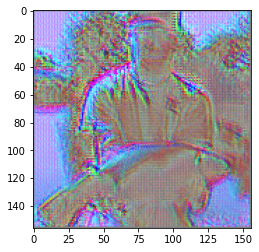

[0/30][0/94]	Loss_D: 1.4567	Loss_G: 0.5133	D(x): 0.5564	D(G(z)): 0.5460 / 0.3995
[0/30][1/94]	Loss_D: 1.4267	Loss_G: 0.5246	D(x): 0.4439	D(G(z)): 0.4295 / 0.3716
[0/30][2/94]	Loss_D: 1.4226	Loss_G: 0.5370	D(x): 0.4081	D(G(z)): 0.3986 / 0.3415
[0/30][3/94]	Loss_D: 1.4121	Loss_G: 0.5546	D(x): 0.3790	D(G(z)): 0.3592 / 0.2998
[0/30][4/94]	Loss_D: 1.4031	Loss_G: 0.5718	D(x): 0.3612	D(G(z)): 0.3293 / 0.2601
[0/30][5/94]	Loss_D: 1.3908	Loss_G: 0.5916	D(x): 0.3111	D(G(z)): 0.2714 / 0.2152
[0/30][6/94]	Loss_D: 1.3782	Loss_G: 0.6040	D(x): 0.2812	D(G(z)): 0.2266 / 0.1877
[0/30][7/94]	Loss_D: 1.3646	Loss_G: 0.6123	D(x): 0.2867	D(G(z)): 0.2032 / 0.1694
[0/30][8/94]	Loss_D: 1.3659	Loss_G: 0.6197	D(x): 0.2674	D(G(z)): 0.1907 / 0.1535
[0/30][9/94]	Loss_D: 1.3607	Loss_G: 0.6269	D(x): 0.2715	D(G(z)): 0.1821 / 0.1379
[0/30][10/94]	Loss_D: 1.3577	Loss_G: 0.6327	D(x): 0.2494	D(G(z)): 0.1616 / 0.1255
[0/30][11/94]	Loss_D: 1.3585	Loss_G: 0.6357	D(x): 0.2405	D(G(z)): 0.1539 / 0.1190
[0/30][12/94]	Loss_D: 1.34

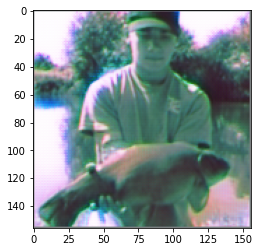

[5/30][0/94]	Loss_D: 1.0488	Loss_G: 0.6902	D(x): 0.8664	D(G(z)): 0.0052 / 0.0060
[5/30][1/94]	Loss_D: 1.0492	Loss_G: 0.6905	D(x): 0.8688	D(G(z)): 0.0052 / 0.0052
[5/30][2/94]	Loss_D: 1.0470	Loss_G: 0.6893	D(x): 0.8802	D(G(z)): 0.0080 / 0.0077
[5/30][3/94]	Loss_D: 1.0439	Loss_G: 0.6902	D(x): 0.8878	D(G(z)): 0.0058 / 0.0060
[5/30][4/94]	Loss_D: 1.0381	Loss_G: 0.6900	D(x): 0.9055	D(G(z)): 0.0069 / 0.0063
[5/30][5/94]	Loss_D: 1.0400	Loss_G: 0.6901	D(x): 0.9029	D(G(z)): 0.0074 / 0.0060
[5/30][6/94]	Loss_D: 1.0503	Loss_G: 0.6902	D(x): 0.8664	D(G(z)): 0.0073 / 0.0059
[5/30][7/94]	Loss_D: 1.0421	Loss_G: 0.6896	D(x): 0.8926	D(G(z)): 0.0061 / 0.0071
[5/30][8/94]	Loss_D: 1.0443	Loss_G: 0.6903	D(x): 0.8878	D(G(z)): 0.0060 / 0.0057
[5/30][9/94]	Loss_D: 1.0430	Loss_G: 0.6878	D(x): 0.9046	D(G(z)): 0.0138 / 0.0106
[5/30][10/94]	Loss_D: 1.0451	Loss_G: 0.6908	D(x): 0.8930	D(G(z)): 0.0061 / 0.0046
[5/30][11/94]	Loss_D: 1.0453	Loss_G: 0.6904	D(x): 0.8835	D(G(z)): 0.0057 / 0.0055
[5/30][12/94]	Loss_D: 1.04

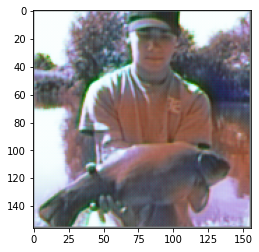

[10/30][0/94]	Loss_D: 1.0580	Loss_G: 0.6880	D(x): 0.8564	D(G(z)): 0.0172 / 0.0103
[10/30][1/94]	Loss_D: 1.0509	Loss_G: 0.6910	D(x): 0.8636	D(G(z)): 0.0059 / 0.0044
[10/30][2/94]	Loss_D: 1.0466	Loss_G: 0.6909	D(x): 0.8764	D(G(z)): 0.0054 / 0.0045
[10/30][3/94]	Loss_D: 1.0436	Loss_G: 0.6905	D(x): 0.8864	D(G(z)): 0.0054 / 0.0052
[10/30][4/94]	Loss_D: 1.0395	Loss_G: 0.6895	D(x): 0.9046	D(G(z)): 0.0089 / 0.0073
[10/30][5/94]	Loss_D: 1.0386	Loss_G: 0.6906	D(x): 0.9043	D(G(z)): 0.0058 / 0.0052
[10/30][6/94]	Loss_D: 1.0405	Loss_G: 0.6887	D(x): 0.9054	D(G(z)): 0.0110 / 0.0090
[10/30][7/94]	Loss_D: 1.0410	Loss_G: 0.6896	D(x): 0.8988	D(G(z)): 0.0085 / 0.0072
[10/30][8/94]	Loss_D: 1.0397	Loss_G: 0.6911	D(x): 0.8993	D(G(z)): 0.0047 / 0.0042
[10/30][9/94]	Loss_D: 1.0394	Loss_G: 0.6890	D(x): 0.9143	D(G(z)): 0.0127 / 0.0084
[10/30][10/94]	Loss_D: 1.0389	Loss_G: 0.6917	D(x): 0.9067	D(G(z)): 0.0032 / 0.0029
[10/30][11/94]	Loss_D: 1.0388	Loss_G: 0.6912	D(x): 0.9015	D(G(z)): 0.0047 / 0.0039
[10/30][12/94]

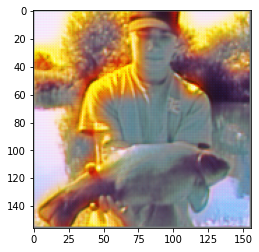

[15/30][0/94]	Loss_D: 1.0231	Loss_G: 0.6916	D(x): 0.9482	D(G(z)): 0.0039 / 0.0032
[15/30][1/94]	Loss_D: 1.0240	Loss_G: 0.6921	D(x): 0.9434	D(G(z)): 0.0023 / 0.0022
[15/30][2/94]	Loss_D: 1.0222	Loss_G: 0.6916	D(x): 0.9519	D(G(z)): 0.0032 / 0.0032
[15/30][3/94]	Loss_D: 1.0191	Loss_G: 0.6917	D(x): 0.9626	D(G(z)): 0.0030 / 0.0028
[15/30][4/94]	Loss_D: 1.0194	Loss_G: 0.6923	D(x): 0.9593	D(G(z)): 0.0018 / 0.0017
[15/30][5/94]	Loss_D: 1.0207	Loss_G: 0.6923	D(x): 0.9558	D(G(z)): 0.0018 / 0.0018
[15/30][6/94]	Loss_D: 1.0188	Loss_G: 0.6915	D(x): 0.9651	D(G(z)): 0.0037 / 0.0033
[15/30][7/94]	Loss_D: 1.0189	Loss_G: 0.6922	D(x): 0.9609	D(G(z)): 0.0018 / 0.0019
[15/30][8/94]	Loss_D: 1.0205	Loss_G: 0.6910	D(x): 0.9616	D(G(z)): 0.0047 / 0.0043
[15/30][9/94]	Loss_D: 1.0190	Loss_G: 0.6923	D(x): 0.9624	D(G(z)): 0.0019 / 0.0016
[15/30][10/94]	Loss_D: 1.0247	Loss_G: 0.6924	D(x): 0.9469	D(G(z)): 0.0019 / 0.0016
[15/30][11/94]	Loss_D: 1.0220	Loss_G: 0.6918	D(x): 0.9526	D(G(z)): 0.0030 / 0.0027
[15/30][12/94]

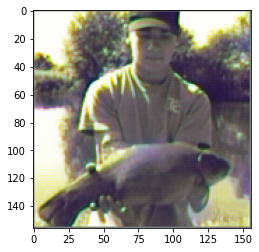

[20/30][0/94]	Loss_D: 1.0459	Loss_G: 0.6908	D(x): 0.8793	D(G(z)): 0.0050 / 0.0048
[20/30][1/94]	Loss_D: 1.0397	Loss_G: 0.6909	D(x): 0.8983	D(G(z)): 0.0049 / 0.0046
[20/30][2/94]	Loss_D: 1.0357	Loss_G: 0.6910	D(x): 0.9104	D(G(z)): 0.0053 / 0.0043
[20/30][3/94]	Loss_D: 1.0376	Loss_G: 0.6913	D(x): 0.9024	D(G(z)): 0.0040 / 0.0038
[20/30][4/94]	Loss_D: 1.0401	Loss_G: 0.6916	D(x): 0.8935	D(G(z)): 0.0031 / 0.0031
[20/30][5/94]	Loss_D: 1.0374	Loss_G: 0.6914	D(x): 0.9028	D(G(z)): 0.0037 / 0.0035
[20/30][6/94]	Loss_D: 1.0339	Loss_G: 0.6914	D(x): 0.9170	D(G(z)): 0.0046 / 0.0035
[20/30][7/94]	Loss_D: 1.0365	Loss_G: 0.6917	D(x): 0.9072	D(G(z)): 0.0032 / 0.0029
[20/30][8/94]	Loss_D: 1.0334	Loss_G: 0.6913	D(x): 0.9158	D(G(z)): 0.0043 / 0.0036
[20/30][9/94]	Loss_D: 1.0405	Loss_G: 0.6916	D(x): 0.8920	D(G(z)): 0.0035 / 0.0031
[20/30][10/94]	Loss_D: 1.0378	Loss_G: 0.6914	D(x): 0.8998	D(G(z)): 0.0038 / 0.0034
[20/30][11/94]	Loss_D: 1.0342	Loss_G: 0.6916	D(x): 0.9115	D(G(z)): 0.0032 / 0.0030
[20/30][12/94]

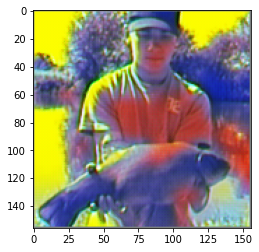

[25/30][0/94]	Loss_D: 1.0272	Loss_G: 0.6925	D(x): 0.9354	D(G(z)): 0.0015 / 0.0012
[25/30][1/94]	Loss_D: 1.0274	Loss_G: 0.6926	D(x): 0.9318	D(G(z)): 0.0012 / 0.0010
[25/30][2/94]	Loss_D: 1.0230	Loss_G: 0.6925	D(x): 0.9458	D(G(z)): 0.0014 / 0.0013
[25/30][3/94]	Loss_D: 1.0242	Loss_G: 0.6926	D(x): 0.9415	D(G(z)): 0.0011 / 0.0011
[25/30][4/94]	Loss_D: 1.0274	Loss_G: 0.6927	D(x): 0.9306	D(G(z)): 0.0009 / 0.0009
[25/30][5/94]	Loss_D: 1.0256	Loss_G: 0.6926	D(x): 0.9372	D(G(z)): 0.0010 / 0.0010
[25/30][6/94]	Loss_D: 1.0218	Loss_G: 0.6925	D(x): 0.9509	D(G(z)): 0.0014 / 0.0013
[25/30][7/94]	Loss_D: 1.0232	Loss_G: 0.6927	D(x): 0.9463	D(G(z)): 0.0009 / 0.0009
[25/30][8/94]	Loss_D: 1.0220	Loss_G: 0.6923	D(x): 0.9491	D(G(z)): 0.0018 / 0.0018
[25/30][9/94]	Loss_D: 1.0235	Loss_G: 0.6926	D(x): 0.9443	D(G(z)): 0.0011 / 0.0011
[25/30][10/94]	Loss_D: 1.0227	Loss_G: 0.6925	D(x): 0.9454	D(G(z)): 0.0013 / 0.0013
[25/30][11/94]	Loss_D: 1.0214	Loss_G: 0.6923	D(x): 0.9508	D(G(z)): 0.0016 / 0.0016
[25/30][12/94]

In [ ]:
#Select device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

# Training Loop
real_label= 1.
fake_label= 0.

#Loss criterion
criterion = nn.BCEWithLogitsLoss()

# Lists to keep track of progress
best_img_list = []
best_G_losses = []
best_D_losses = []


num_epochs = 30

#define models and move to
G = UNET().to(device)
G = G.apply(weights_init)
D = PatchGAN(divisor=6).to(device)
D = D.apply(weights_init)

# Setup ptimizers for both G and D
optimizerD = optim.Adam(D.parameters(),lr=0.0001,betas=(0.5,0.999))
optimizerG = optim.Adam(G.parameters(),lr=0.0001,betas=(0.5,0.999))

print("Starting Training Loop...")

#Loop over epochs
for epoch in range(num_epochs):

    #define iterators and their length
    iterator_rgb = iter(train_rgb_loader)
    rgb_len = len(iterator_rgb)
    iterator_bw = iter(train_bw_loader)
    bw_len = len(iterator_bw) 

    #Loop over batches
    G_batch_loss = []
    D_batch_loss = []
    for i in range(rgb_len-1):

        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        
        ## Train with all-real batch
        D.zero_grad()

        # Select batch and move to device
        batch_rgb,_ = next(iterator_rgb)
        batch_bw,_ = next(iterator_bw)
        batch_bw = batch_bw.to(device)
        batch_rgb = batch_rgb.to(device)

        # Generate fake image batch with G
        generated = G(batch_bw)
        image_size = generated.size()[-1]

        #center crop original batches
        batch_rgb = T.functional.center_crop(batch_rgb,(image_size,image_size))
        batch_bw = T.functional.center_crop(batch_bw,(image_size,image_size))


        #define tensor of real_label values
        b_size = batch_rgb.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

        # Forward pass real batch through D
        real_pair = torch.cat((batch_rgb,batch_bw),1) #x and y
        output = D(real_pair).view(-1)

        # Calculate loss on all-real batch
        errD_real = criterion(output, label)

        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        
        #store image every 100 epochs   
        if i==0 and epoch%5==0:
          plt.imshow(generated[0].permute(1,2,0).cpu().detach().numpy())
          plt.show()
          best_img_list.append(generated[0].permute(1,2,0).cpu().detach().numpy())

        #generate fake_label tensor
        label.fill_(fake_label)

        # Classify all fake batch with D
        fake_pair = torch.cat((generated,batch_bw),1)
        output = D(fake_pair.detach()).view(-1)

        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)

        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        
        # Update D
        optimizerD.step()

        # (2) Update G network: maximize log(D(G(z)))

        G.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost

        #perform another forward pass of all-fake batch through D
        output = D(fake_pair).view(-1)

        # Calculate G's loss based on this output
        errG = criterion(output, label)
        errG.backward()

        L1_term = 0.3*generator_regularization(generated,batch_rgb,device)
        L1_term.backward()

        errg = errG + L1_term

        D_G_z2 = output.mean().item()

        # Update G
        optimizerG.step()

        # Output training stats
        print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
              % (epoch, num_epochs, i, len(iterator_rgb)-2,
                  errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_batch_loss.append(errG.item())
        D_batch_loss.append(errD.item())


    # Save network parameters at the end of epochs
    torch.save(G.state_dict(), 'best_G_params.pth')
    torch.save(D.state_dict(), 'best_D_params.pth')
      
    best_G_losses.append(np.mean(G_batch_loss))
    best_D_losses.append(np.mean(D_batch_loss))

### Plot best training

6


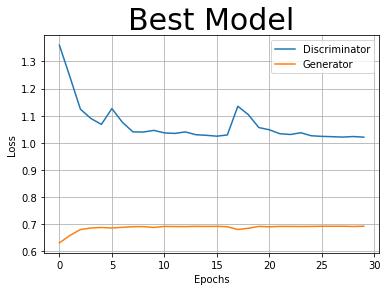

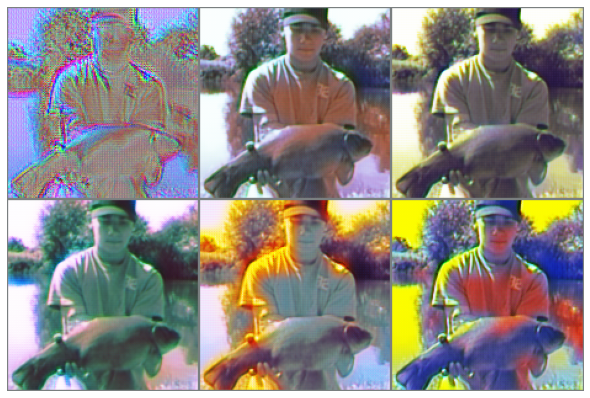

In [ ]:
print(len(best_img_list))
#Learning curves per epoch
plt.figure()
plt.plot(best_D_losses,label="Discriminator")
plt.plot(best_G_losses,label="Generator")
plt.legend()
plt.title("Best Model",fontsize=30)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.savefig("bestmodel_train.png")
plt.grid()
plt.show()



#SGD_img_list #len=20
#plot images
#fig params
rows = 2
columns = 3
heights = np.repeat(5,rows)
widths = np.repeat(5,columns)
fig_width = 8.
fig_height = fig_width * sum(heights) / sum(widths)
fig,ax = plt.subplots(rows,columns,figsize=(fig_width, fig_height),gridspec_kw={'height_ratios':heights})

for i in range(rows):
    for j in range(columns):
        ax[i,j].imshow(best_img_list[i+2*j]) #now empty
        ax[i,j].axis('off')
        
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.savefig("best_image_generation.png")
plt.show()

### Testing and plots

cuda
Starting Test Loop...


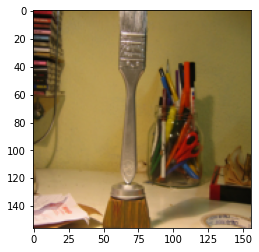

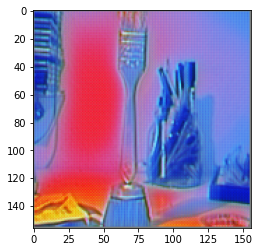

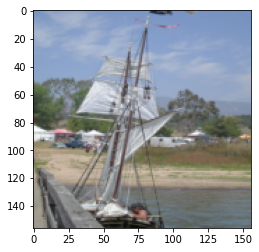

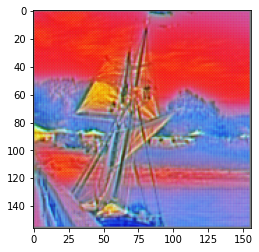

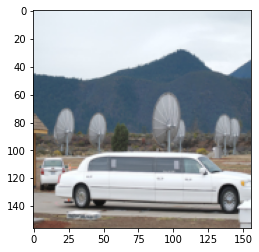

...

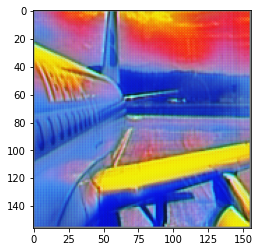

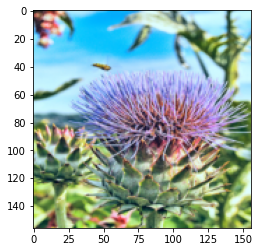

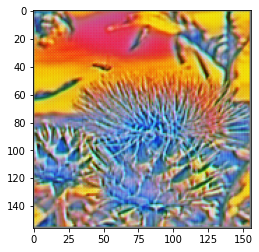

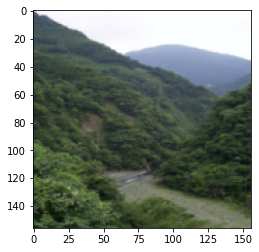

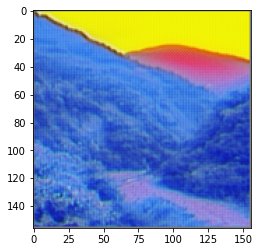

In [ ]:


#Select device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

# Training Loop
real_label= 1.
fake_label= 0.

#Loss criterion
criterion = nn.BCEWithLogitsLoss()

# Lists to keep track of progress
test_img_list = []
original_img_list = []
best_G_losses = []
best_D_losses = []

num_epochs = 30

G = UNET().to(device)
G.load_state_dict(torch.load('best_G_params.pth'))
G.eval()
D = PatchGAN(divisor=6).to(device)
D.load_state_dict(torch.load('best_D_params.pth'))
D.eval()

print("Starting Test Loop...")

#define iterators and their length
iterator_rgb = iter(test_rgb_loader)
rgb_len = len(iterator_rgb)
iterator_bw = iter(test_bw_loader)
bw_len = len(iterator_bw) 

#Loop over batches
errD_real_tot = []
errD_fake_tot = []
errD_tot = []

errG_tot = []
L1_term_tot = []
errg_tot = []

with torch.no_grad():

    for i in range(rgb_len-1):

        # Select batch and move to device
        batch_rgb,_ = next(iterator_rgb)
        batch_bw,_ = next(iterator_bw)
        batch_bw = batch_bw.to(device)
        batch_rgb = batch_rgb.to(device)

        # Generate fake image batch with G
        generated = G(batch_bw)
        image_size = generated.size()[-1]

        #center crop original batches
        batch_rgb = T.functional.center_crop(batch_rgb,(image_size,image_size))
        batch_bw = T.functional.center_crop(batch_bw,(image_size,image_size))


        #define tensor of real_label values
        b_size = batch_rgb.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

        # Forward pass real batch through D
        real_pair = torch.cat((batch_rgb,batch_bw),1) #x and y
        output = D(real_pair).view(-1)

        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        errD_real_tot.append(errD_real.cpu().detach().numpy())

            
        #store image every 100 epochs   
        if i%5==0:
          plt.imshow(batch_rgb[0].permute(1,2,0).cpu().detach().numpy())
          plt.show()
          plt.imshow(generated[0].permute(1,2,0).cpu().detach().numpy())
          plt.show()
          original_img_list.append(batch_rgb[0].permute(1,2,0).cpu().detach().numpy())
          test_img_list.append(generated[0].permute(1,2,0).cpu().detach().numpy())

        #generate fake_label tensor
        label.fill_(fake_label)

        # Classify all fake batch with D
        fake_pair = torch.cat((generated,batch_bw),1)
        output = D(fake_pair.detach()).view(-1)

        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        errD_fake_tot.append(errD_fake.cpu().detach().numpy())


        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        errD_tot.append(errD.cpu().detach().numpy())
            

        #compute G loss
        label.fill_(real_label)  # fake labels are real for generator cost

        #perform another forward pass of all-fake batch through D
        output = D(fake_pair).view(-1)

        # Calculate G's loss based on this output
        errG = criterion(output, label)
        errG_tot.append(errG.cpu().detach().numpy())

        L1_term = 0.3*generator_regularization(generated,batch_rgb,device)
        L1_term_tot.append(L1_term.cpu().detach().numpy())

        errg = errG + L1_term
        errg_tot.append(errg.cpu().detach().numpy())

10
10


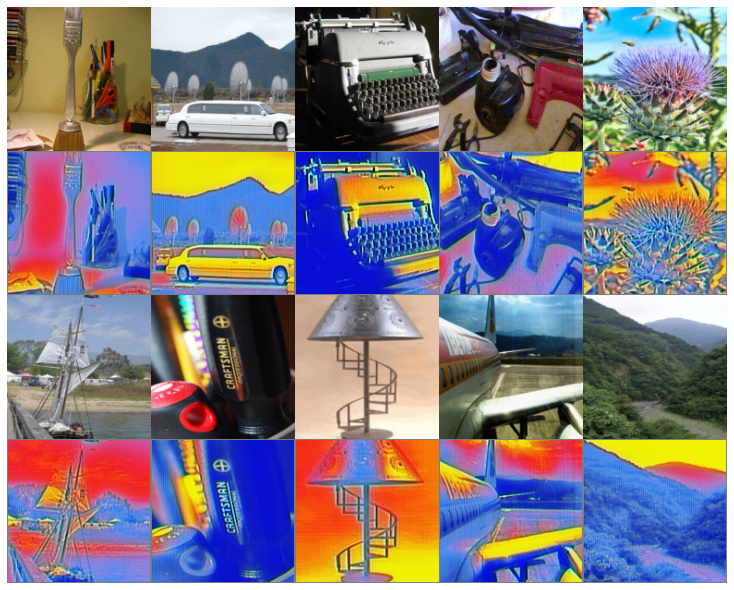

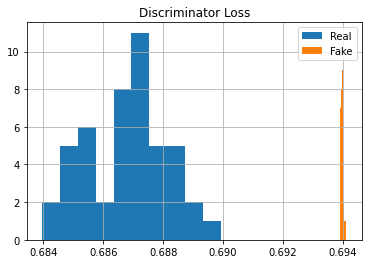

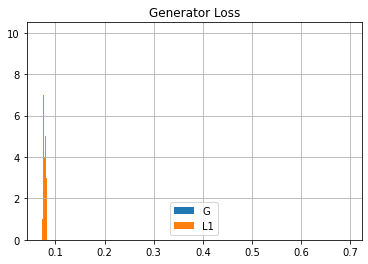

In [ ]:
# Lists to keep track of progress
#test_img_list = []
#original_img_list = []

print(len(original_img_list))
print(len(test_img_list))

#SGD_img_list #len=20
#plot images
#fig params
rows = 4
columns = 5
heights = np.repeat(5,rows)
widths = np.repeat(5,columns)
fig_width = 10.
fig_height = fig_width * sum(heights) / sum(widths)
fig,ax = plt.subplots(rows,columns,figsize=(fig_width, fig_height),gridspec_kw={'height_ratios':heights})

for j in range(columns):
    ax[0,j].imshow(original_img_list[2*j]);ax[0,j].axis('off')
    ax[1,j].imshow(test_img_list[2*j]);ax[1,j].axis('off')
    ax[2,j].imshow(original_img_list[2*j+1]);ax[2,j].axis('off')
    ax[3,j].imshow(test_img_list[2*j+1]);ax[3,j].axis('off')
        
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
plt.savefig("test_image_generation.png")
plt.show()

plt.figure()
#plt.hist(errD_tot,label="total")
plt.hist(errD_real_tot,label="Real")
plt.hist(errD_fake_tot,label="Fake")
plt.title("Discriminator Loss")
plt.grid()
plt.legend()

plt.show()

plt.figure()
#plt.hist(errD_tot,label="total")
plt.hist(errG_tot,label="G")
plt.hist(L1_term_tot,label="L1")
plt.title("Generator Loss")
plt.grid()
plt.legend()
plt.show()


In [ ]:
torch.cuda.empty_cache()